# Now that 0x0, 1x1, 0x2 are all in .py file as functions
can start testing the effects of varying the parameters. The parameters of interest to vary are
- $\alpha$, the amp map power, which has default value -3.0
- $\beta_0$, the SED power, which has default value -3.2
- $\gamma$, the power for the $C_\ell^{\beta\beta}$. Must be constrained to $\gamma<-2$ for convergence
- $\nu_0$, the freqency we do our Taylor expansion about. Current default is 95 GHz
- $A_s, A_\beta, \ell_*$ these are less interesting as they are degenerate with one another. We can probably leave $\ell_*=80$ and just vary the synch and beta amplitudes. 

In [1]:
%load_ext autoreload
# to make modification in .py file type %autoreload

%load_ext line_profiler
#for finding out how long code takes to run
#an example of how to get diagnostics on functions
#%lprun -f ff.generate_map_full ff.generate_map_full(384, A_BB, alpha_BB, beta_sigma, freqs, nu0)

In [2]:
#trying to consolidate the work so far into a cohesive document and notation. Pushing definitions into 
#separate .py file

#------packages-------------------
%pylab inline
import time
import healpy as hp
import matplotlib.pyplot as plt
import foreground_functions as ff
import scipy.special as sp #for the zeta function sp.zeta() in the 0x2 term
from scipy.stats import kstest, norm

#-------BB parameters (to start)--------
A_BB = 1.7e3
alpha_BB = -3.0
beta_BB = -3.2
# beta_sigma = 1.5e-6

A_beta = 1e-6
gamma_BB = -2.1 #needs to be less than -2 for the 0x2 term to converge
nu0 = 95e9

crit = 2/np.log(10)
sigma_default = crit/3

# #-------map paramters--------------------
# nside = 128
# Lmax = 3*nside
# ells = np.arange(0,Lmax)

#define list of frequencies going from 10 to 300 GHz, sampling 20 points
freqs = np.linspace(30,300,4)*1.e9

Populating the interactive namespace from numpy and matplotlib


In [3]:
#define some different ranges of each parameter

#set of alpha values
alphas = np.linspace(-6., -1., 6)
#set of beta_0 values
betas = np.linspace(-6., -1., 10)
#set of gamma values
gammas = np.linspace(-4., -2.001, 10)
#set nu0 values
nu0s = np.linspace(2.3e9, 100e9, 3)

In [4]:
%autoreload

In [5]:
#to do here
'''
write script to take in relevant arguments and then outputs all
the plots of the powerspectra overlayed with the 0x0--0x2 moments
at the relevant freqencies

plot residuals and see what's up

add in a parameter to the plots to do multiple realisations and plot the avg power spectrum we're trying to fit
could also put boolean optional parameter to overlay the multiple realisations
''';

In [4]:
#moments with default values to test the residual plots
ells = np.arange(0,384)
moment0x0 = ff.auto0x0(freqs)
moment1x1 = ff.auto1x1(freqs)
moment0x2 = ff.auto0x2(freqs)
model = moment0x0+moment1x1+moment0x2

In [48]:
test_map = ff.map_full_power(freqs)

In [49]:
resid = np.zeros((len(freqs), len(ells)))
for i in range(len(freqs)):
    resid[i] = hp.anafast(test_map[i])-model[i]

In [50]:
#make a function to calculate chi-square
def get_chi_square(resid):
    chi_square = 0
    for i in range(len(resid)):
        chi_square += resid[i]**2
    return chi_square

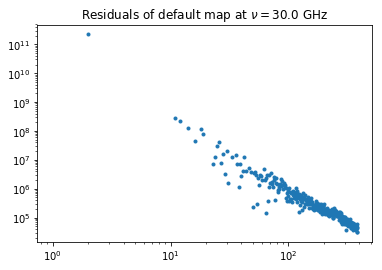

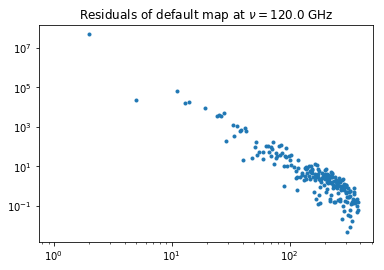

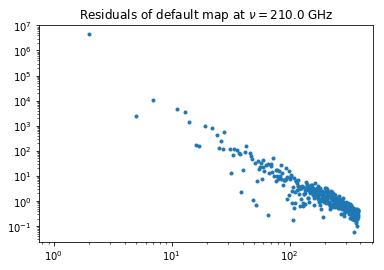

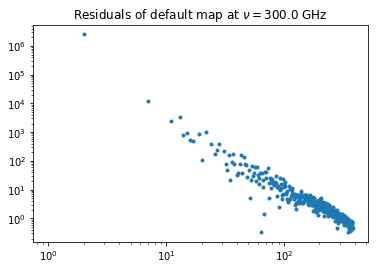

In [51]:
for i in range(len(freqs)):
    figure()
    loglog(ells, resid[i], '.')
    title(r'Residuals of default map at $\nu=$' + str(np.round(1e-9*freqs[i],2)) + ' GHz')

In [52]:
chi_square = np.zeros(len(freqs))
for i in range(len(freqs)):
    chi_square[i] = get_chi_square(resid[i])

In [53]:
chi_square

array([4.90181797e+22, 2.14374957e+15, 1.91110509e+13, 6.29185070e+12])

Text(0.5, 1.0, 'loglog of chi^2 vs frequency with fixed other parameters')

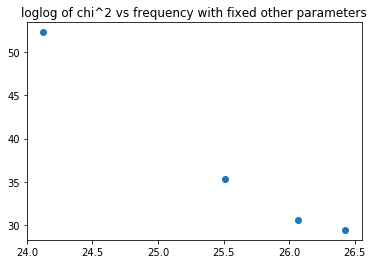

In [54]:
scatter(np.log(freqs),np.log(chi_square))
title('loglog of chi^2 vs frequency with fixed other parameters')

In [55]:
%autoreload

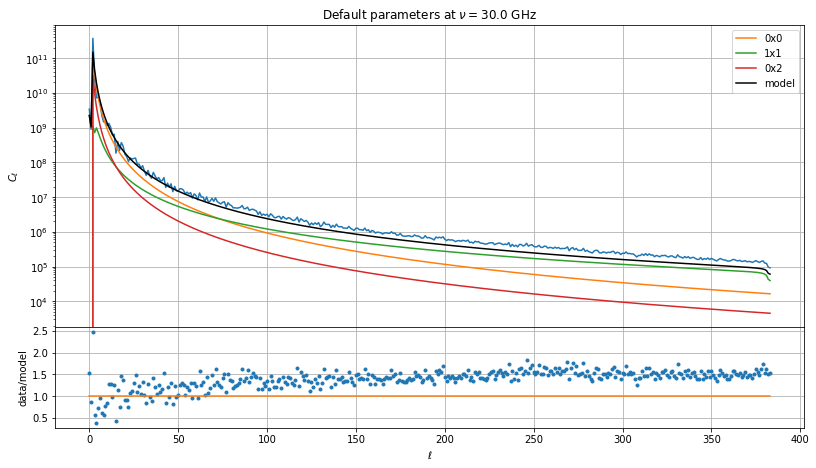

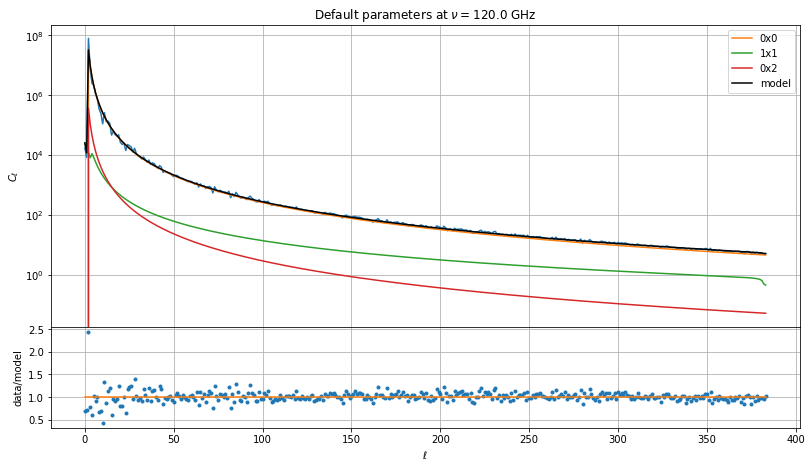

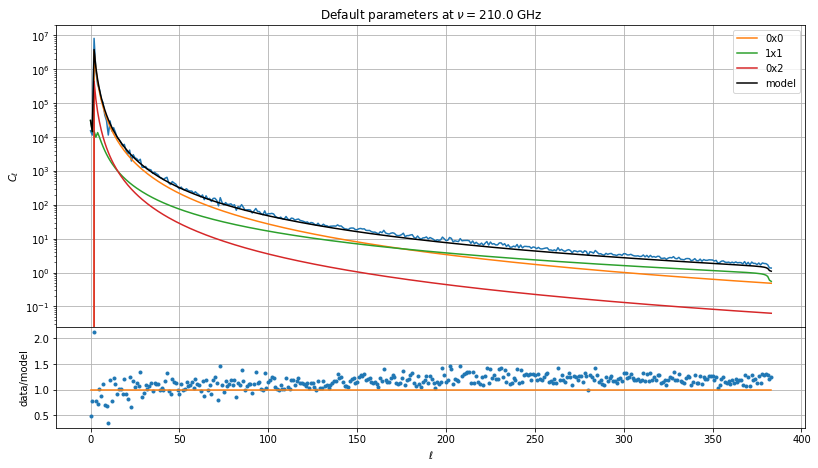

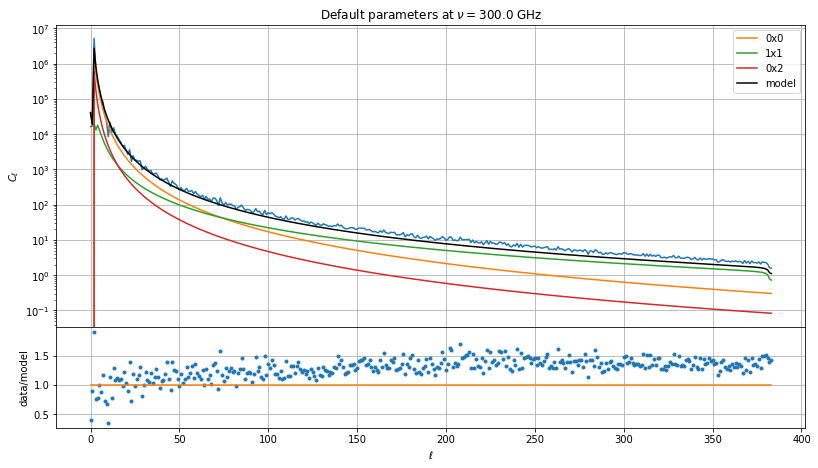

In [56]:
for i in range(len(freqs)):
    anafast = hp.anafast(test_map[i])
    
    fig1 = figure(i, figsize=(13,7))
    
    #Plot Data-model
    frame1=fig1.add_axes((.1,.3,.8,.6))
    #xstart, ystart, xend, yend [units are fraction of the image frame, from bottom left corner]
    semilogy(ells, anafast)
    semilogy(ells, moment0x0[i], label='0x0')
    semilogy(ells, moment1x1[i], label='1x1')
    semilogy(ells, moment0x2[i], label='0x2')
    semilogy(ells, model[i], 'k', label='model')
    frame1.set_xticklabels([]) #Remove x-tic labels for the first frame
    ylabel(r'$C_\ell$')
    title(r'Default parameters at $\nu=$' + str(np.round(1e-9*freqs[i],2)) + ' GHz')
    grid()
    legend()
    #Residual plot
    ratio = anafast/model[i]
    
#     difference = np.abs(anafast-model[i])
    frame2=fig1.add_axes((.1,.1,.8,.2)) 
    plot(ells, ratio, '.')
    plot(ells, ones_like(ells))
    ylabel('data/model')
    xlabel(r'$\ell$')
#     semilogy(ells,difference,'.')
    grid()
    

In [57]:
resid.shape

(4, 384)

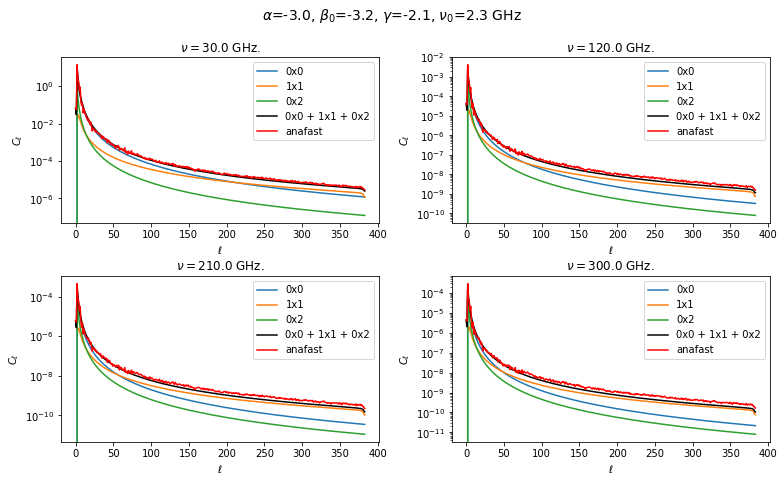

In [64]:
ff.get_plots(freqs)

In [6]:
%autoreload

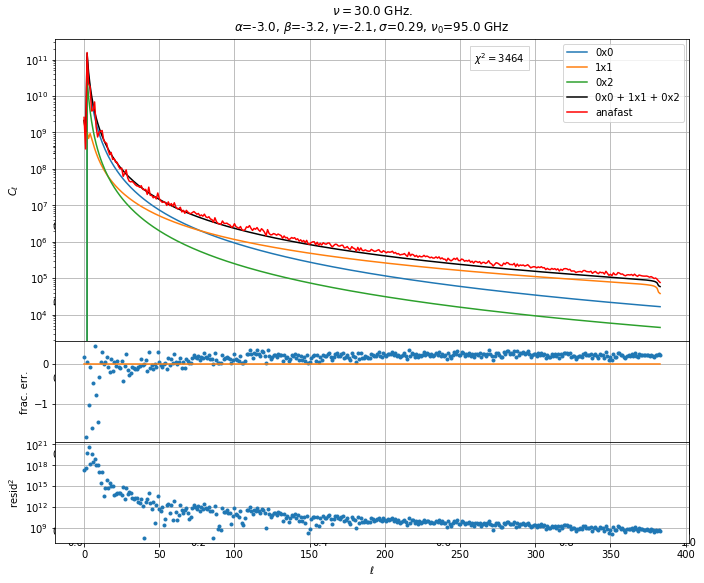

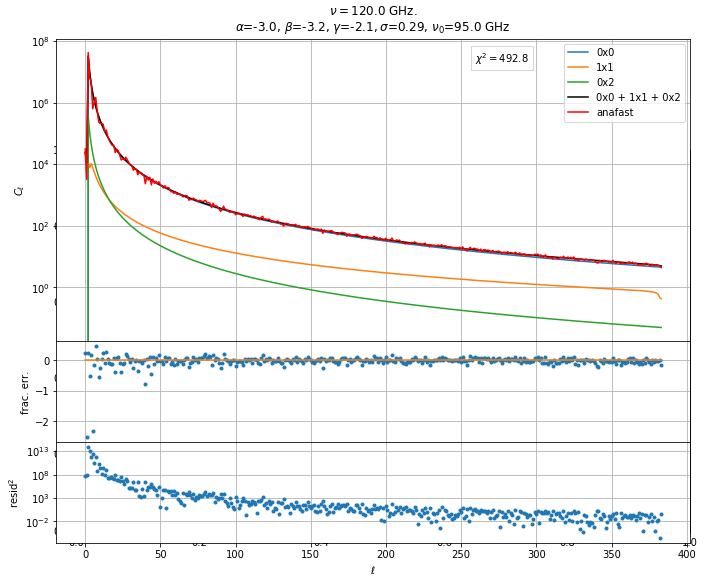

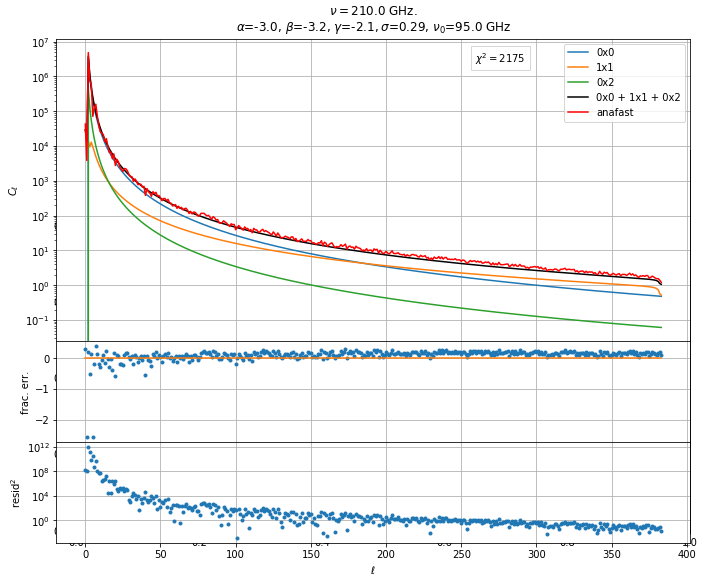

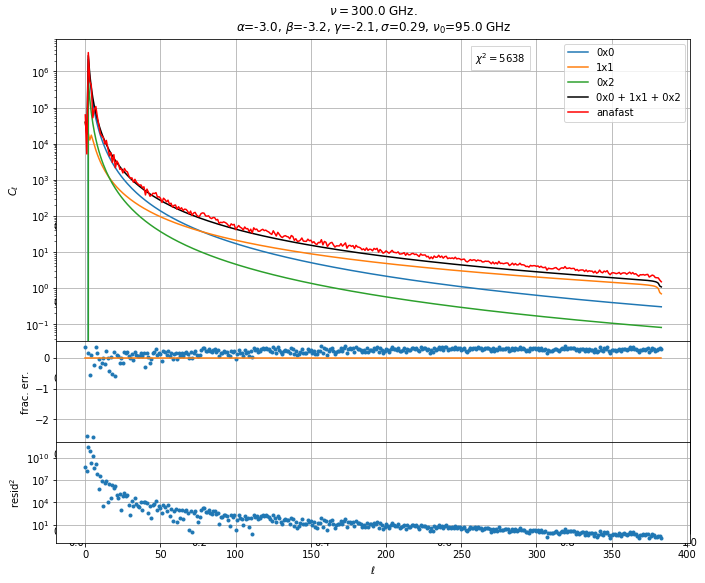

11.929829835891724


In [7]:
start=time.time()
ff.get_plots(freqs)
print(time.time()-start)

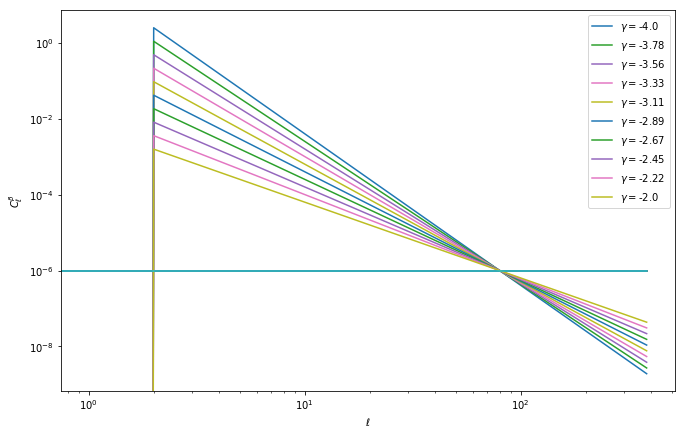

In [164]:
#check the amplitude normalisation for gamma
#what it used to look like, now instead of fixing that point we fix the std of the beta map based on convergence
# figure(figsize=(11,7))
# for gamma in gammas:
#     bcls, beta_map = ff.map_power_beta(gamma=gamma)
#     loglog(bcls, label=r'$\gamma=$'+str(np.round(gamma,2)))
#     x = np.arange(384)
#     y = A_beta*ones_like(x)
#     loglog(y)
#     xlabel(r'$\ell$')
#     ylabel(r'$C_\ell^\beta$')
#     legend();

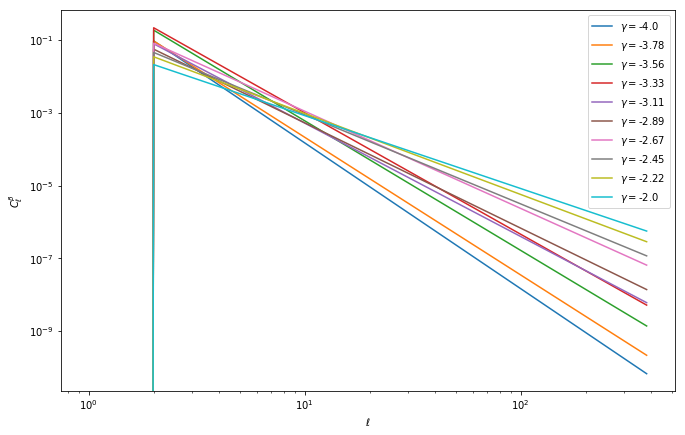

In [68]:
%autoreload
#check the amplitude normalisation for gamma
figure(figsize=(11,7))
for gamma in gammas:
    bcls, beta_map = ff.map_power_beta(gamma=gamma)
    check_bcls = hp.anafast(beta_map)
    loglog(bcls, label=r'$\gamma=$'+str(np.round(gamma,2)))
#     loglog(check_bcls, label=r'$\gamma=$'+str(np.round(gamma,2)))
#     x = np.arange(384)
#     y = A_beta*ones_like(x)
#     loglog(y)
    xlabel(r'$\ell$')
    ylabel(r'$C_\ell^\beta$')
    legend();

In [69]:
%autoreload
bcls_2 , betamap_2 = ff.map_power_beta(gamma=-2.1)
bcls_4 , betamap_4 = ff.map_power_beta(gamma=-4.0)

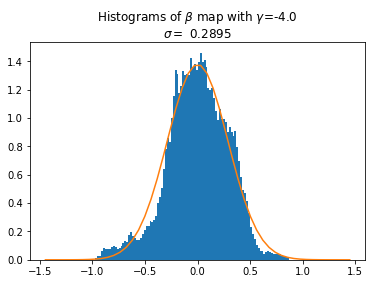

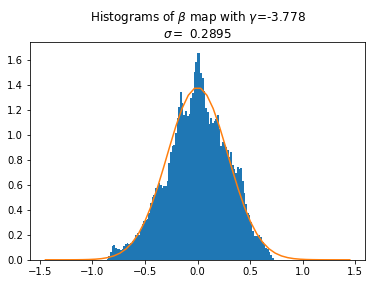

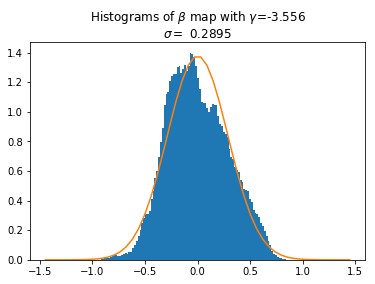

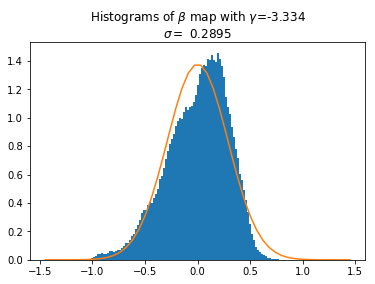

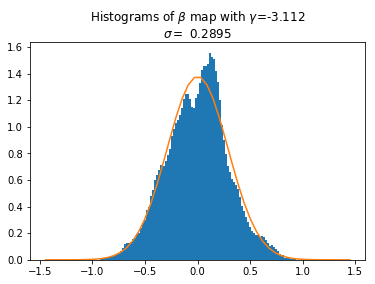

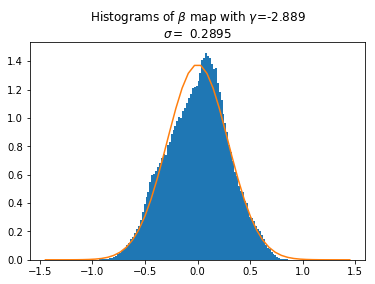

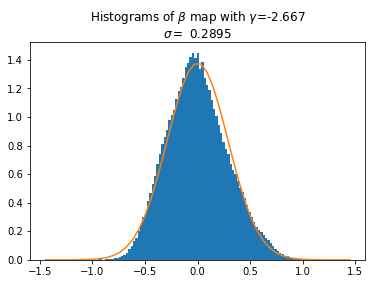

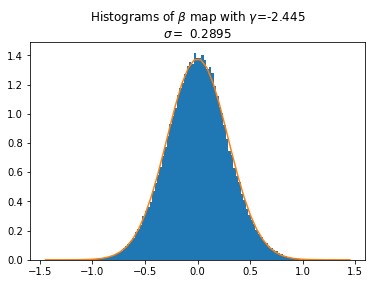

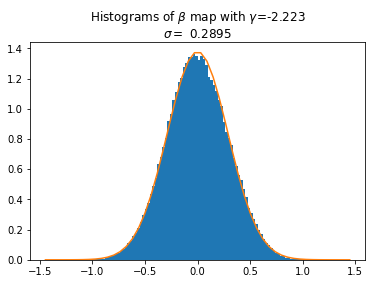

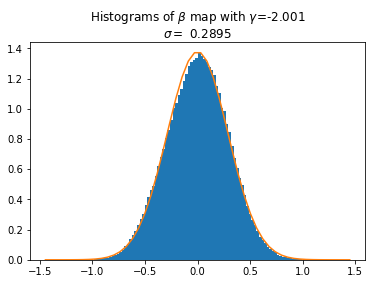

In [72]:
for i in range(len(gammas)):
    bcls_i, betamap_i = ff.map_power_beta(gamma=gammas[i])
    mean = np.mean(betamap_i)
    std = np.std(betamap_i)
    betamap_i -= mean
#     hp.mollview(betamap_i)
    
    figure()
    x = np.linspace(-5*std, 5*std)
    y = norm(0, std)
    title(r'Histograms of $\beta$ map with $\gamma$='+str(np.round(gammas[i],3)) + '\n' + r'$\sigma = $ {:.4f}'.format(std))
    hist(betamap_i, bins=100, density=True);
    plot(x, y.pdf(x))

0.28952965460216784

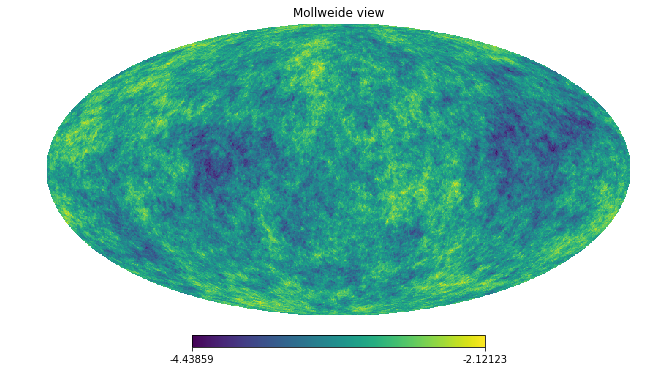

In [73]:
hp.mollview(betamap_2)
np.std(betamap_2)

0.28952965460216784

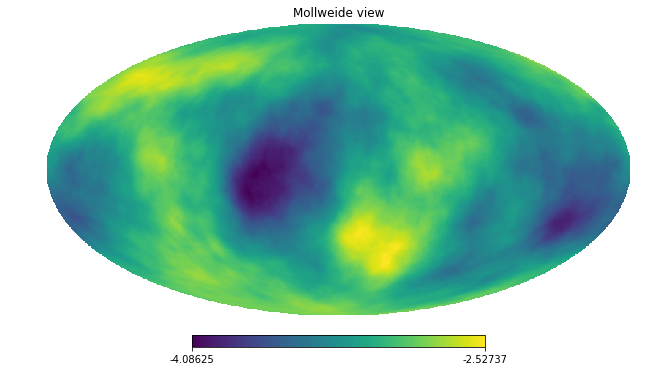

In [74]:
hp.mollview(betamap_4)
np.std(betamap_4)

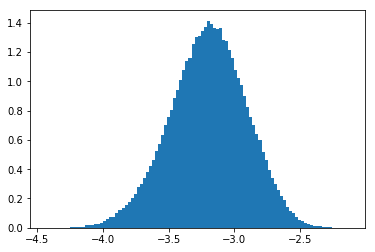

In [75]:
hist(betamap_2, bins=100, density=True);

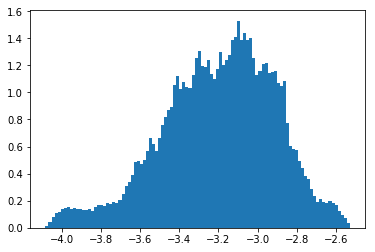

In [76]:
hist(betamap_4, bins=100, density=True);

# Vary $\nu_0$
# THIS IS NO LONGER INTERESTING AS WE HAVE A REQUIREMENT OF CONVERGENCE, WE CAN CHOOSE TO SET $\nu_0 = 95 \ \rm GHz$.

In [96]:
%autoreload

In [97]:
# for nu in nu0s:
#     ff.get_plots(freqs, nu0=nu)    

# Vary $\alpha$

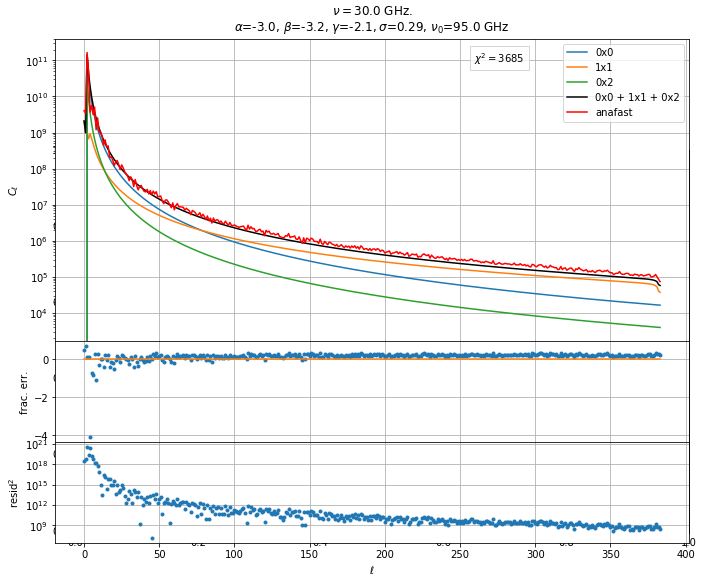

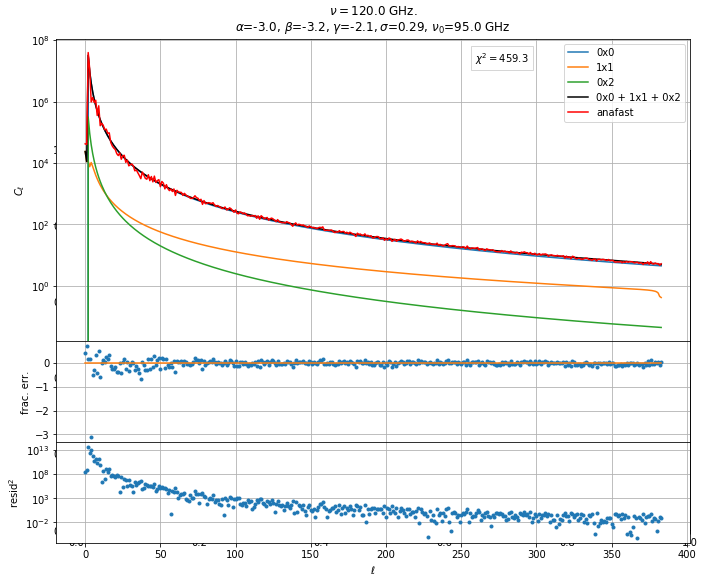

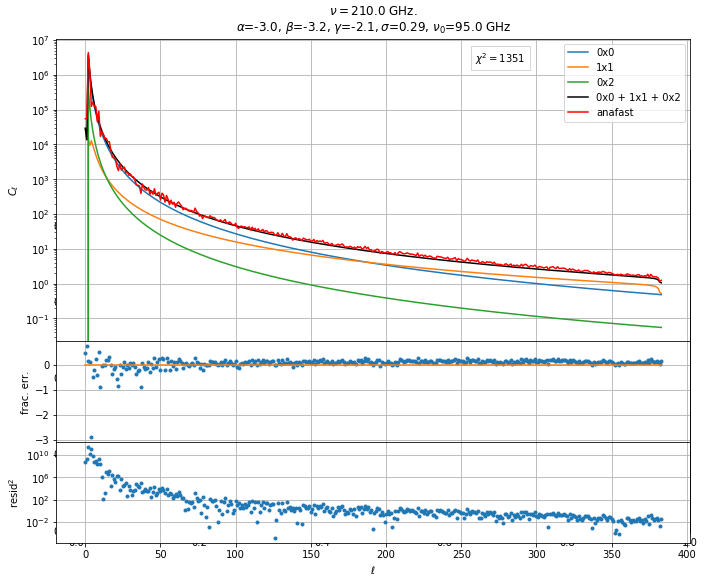

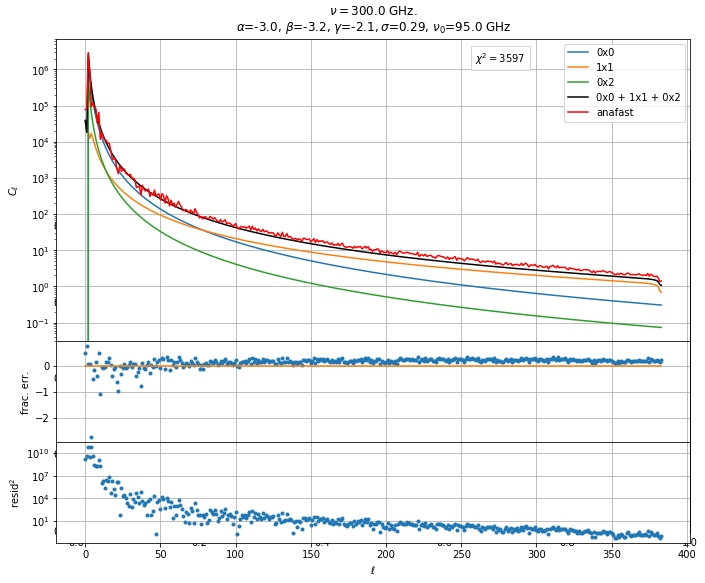

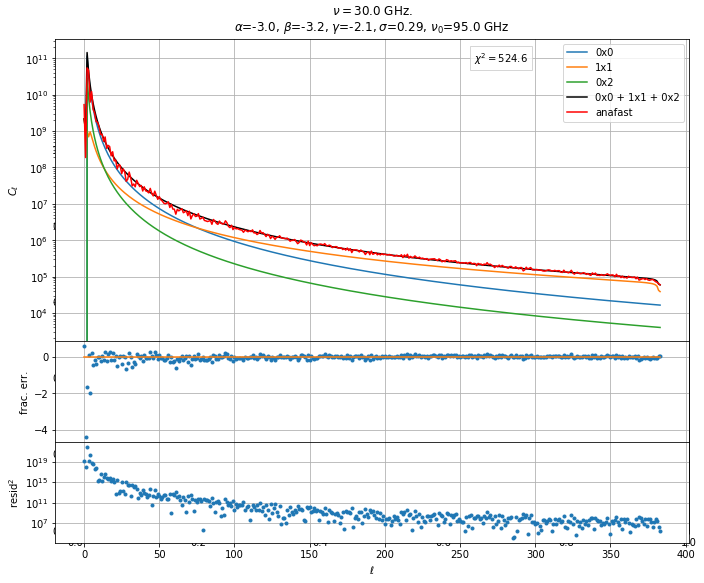

...

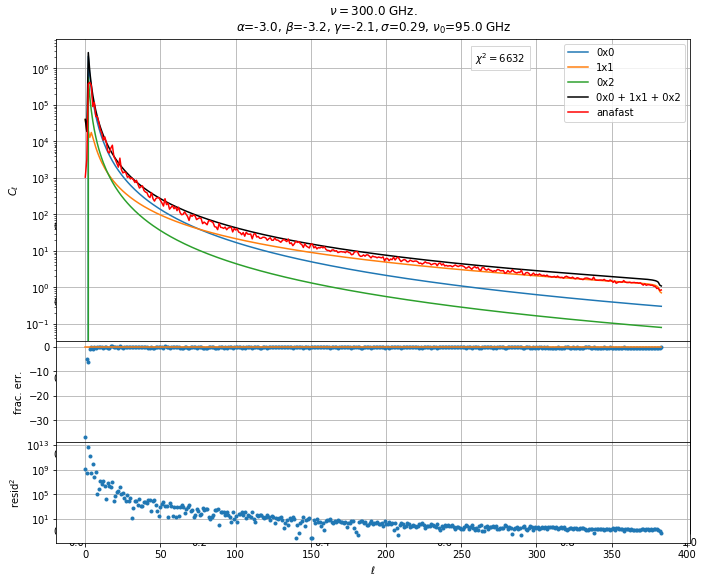

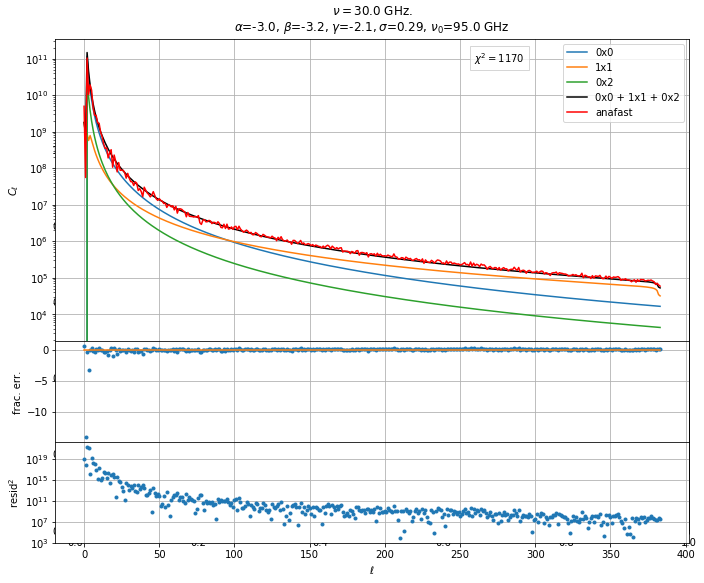

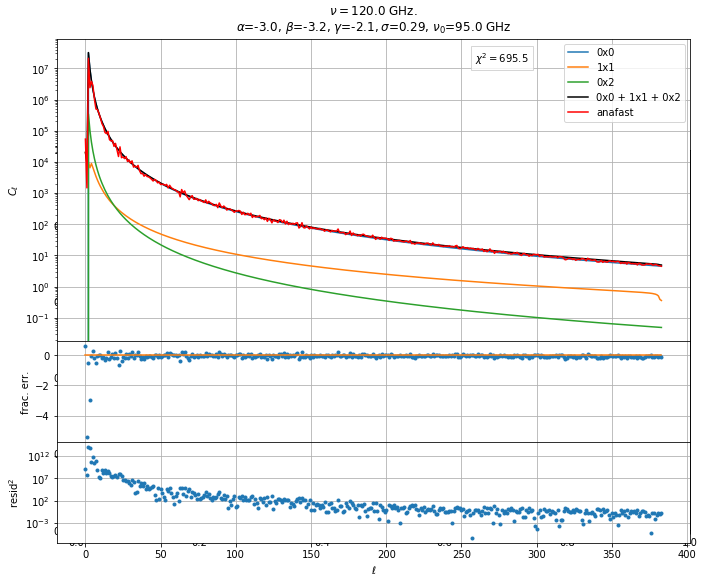

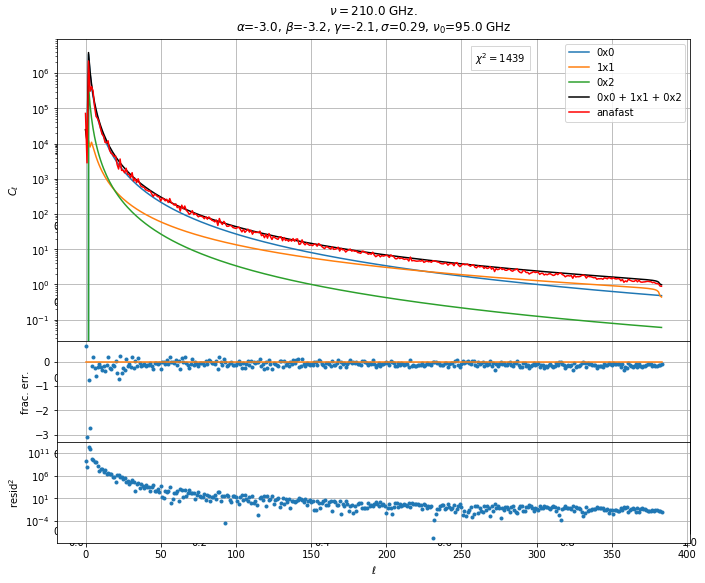

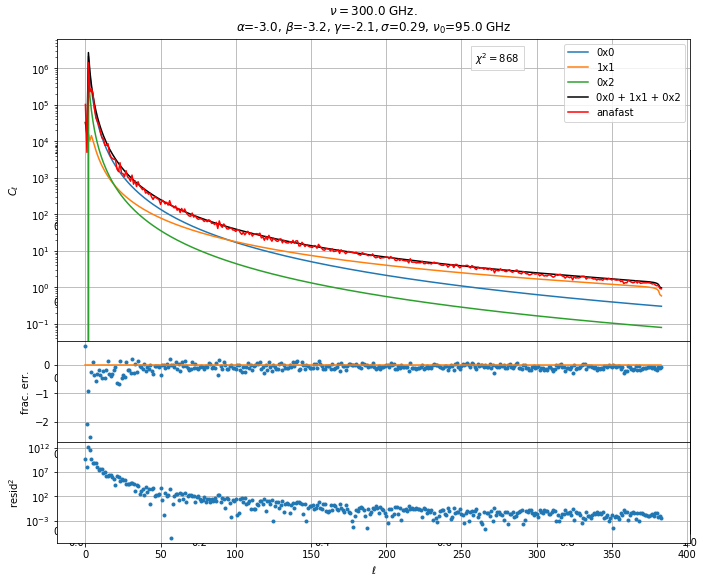

In [8]:
for alpha in alphas:
    ff.get_plots(freqs)

# Vary $\beta$

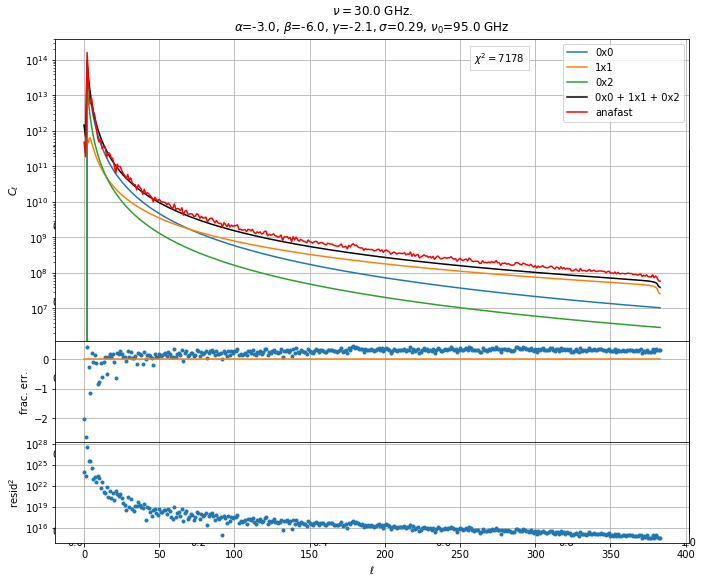

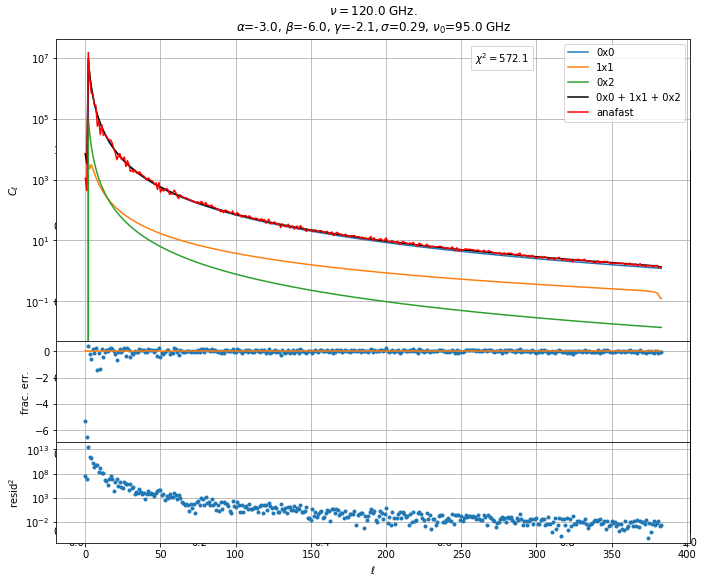

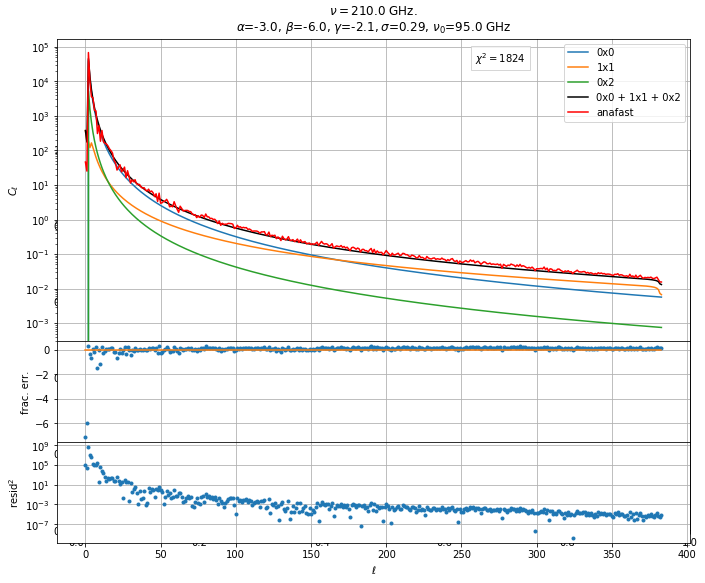

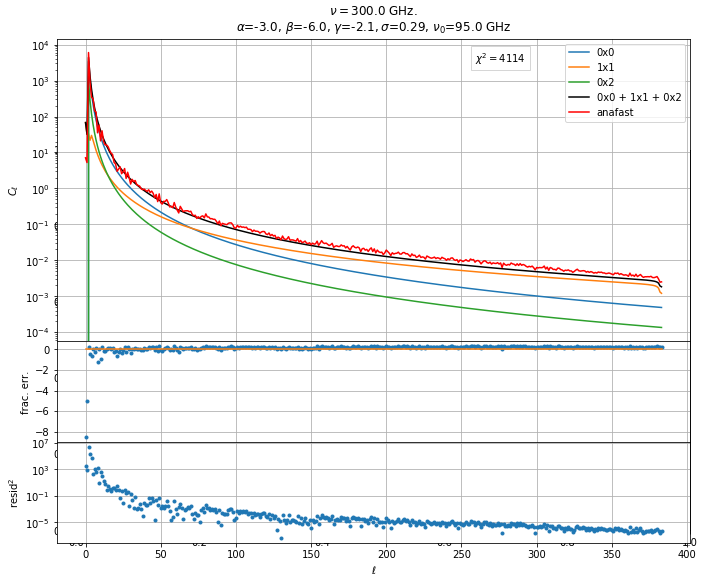

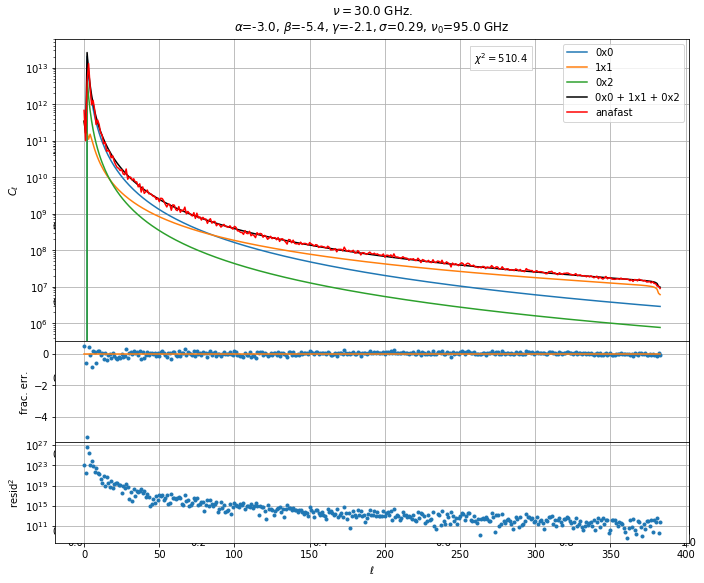

...

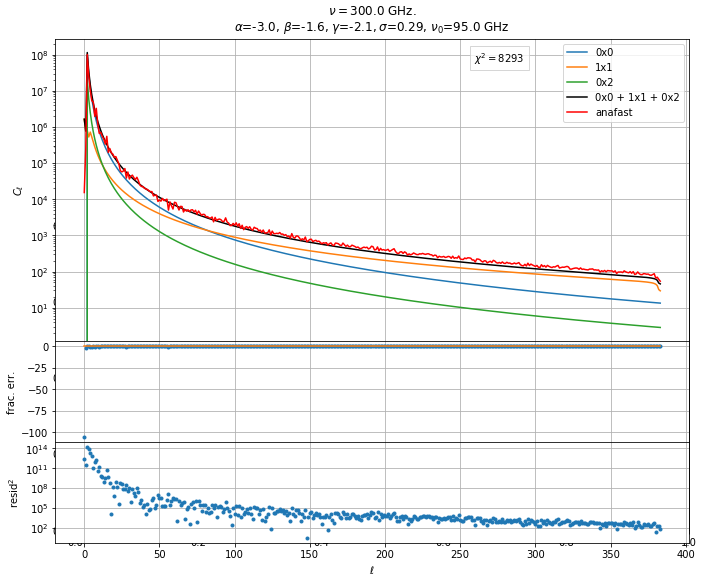

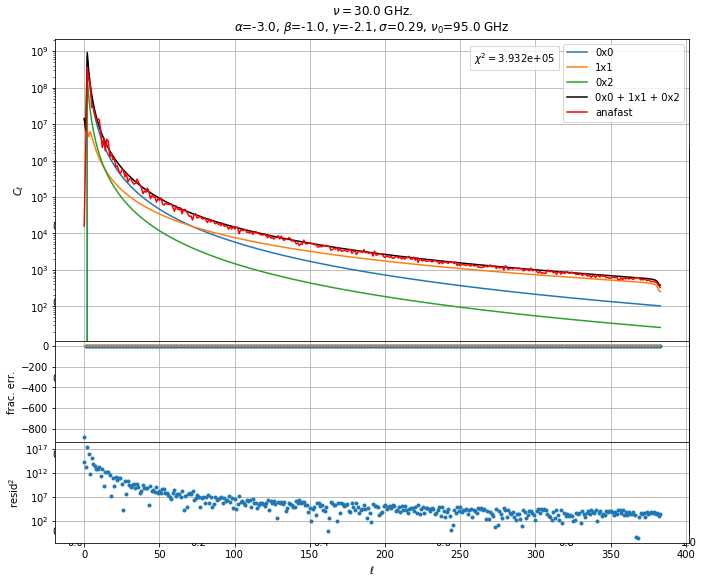

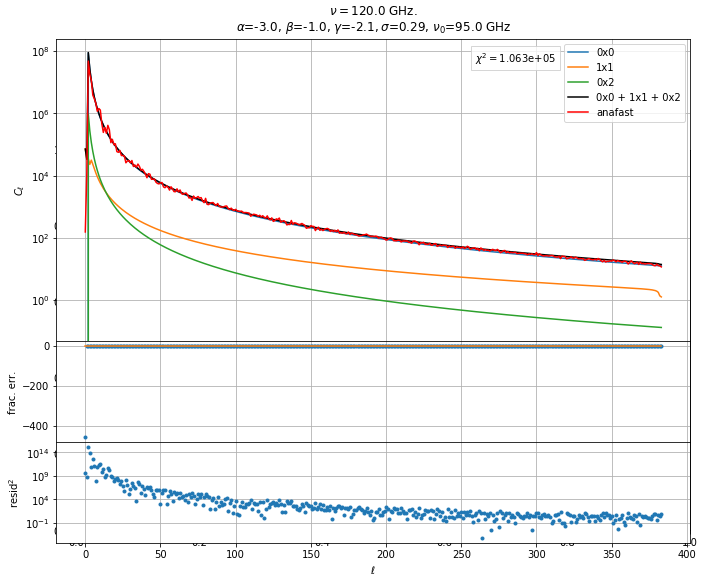

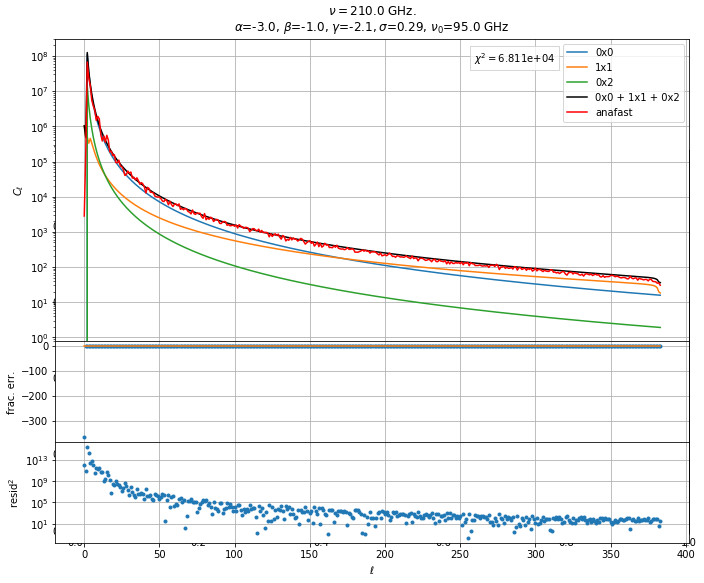

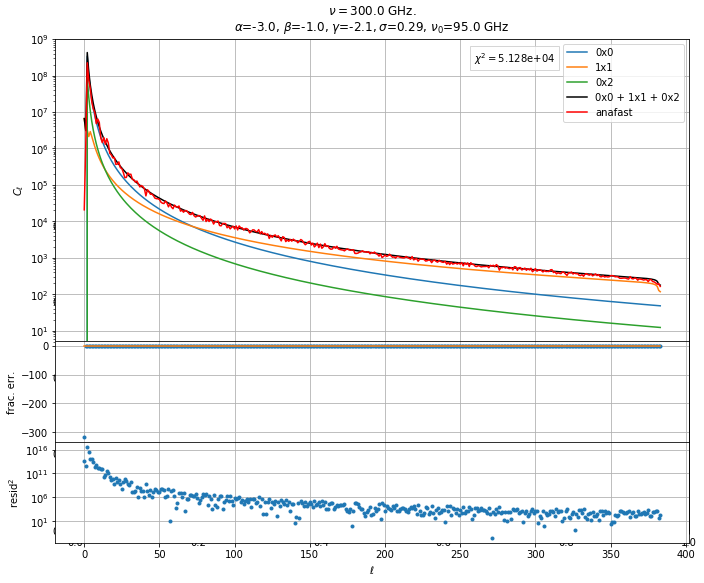

In [9]:
for beta in betas:
    ff.get_plots(freqs, beta=beta)

# Vary $\gamma$

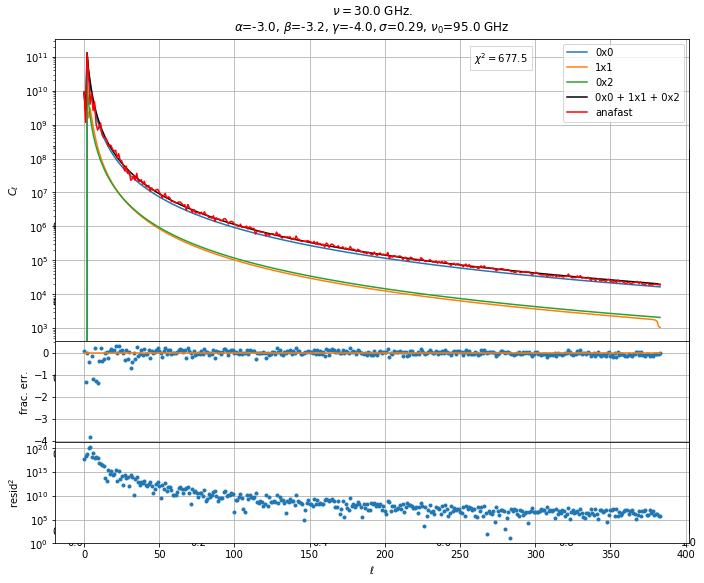

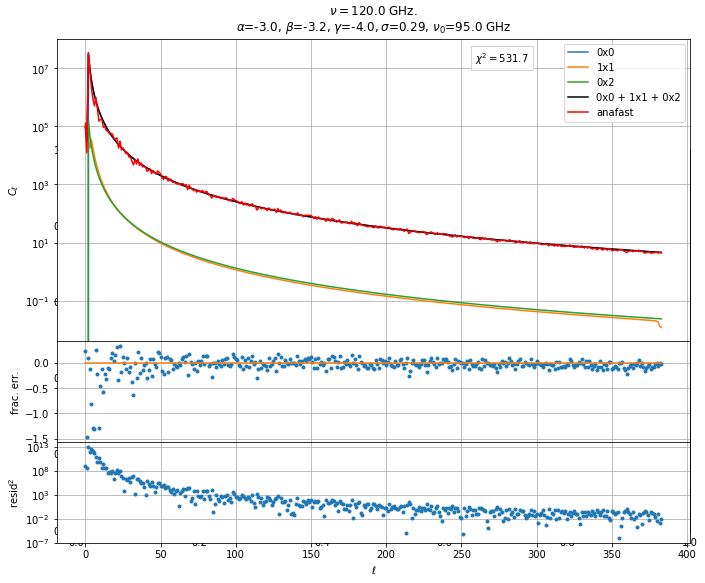

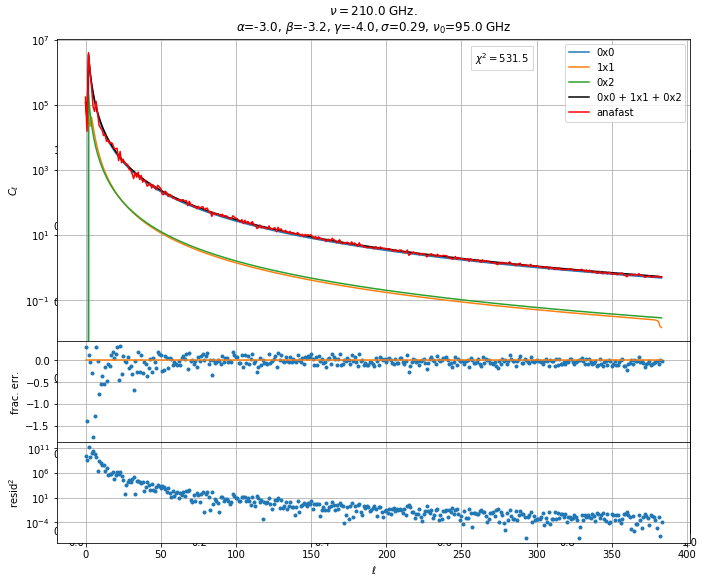

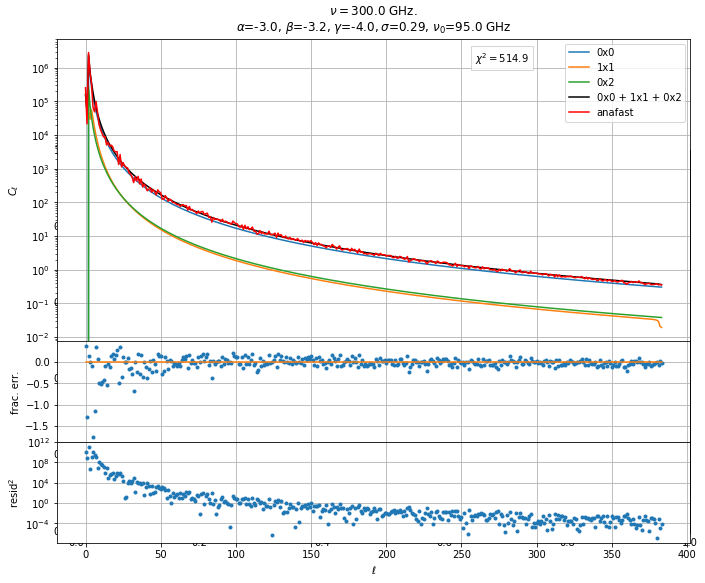

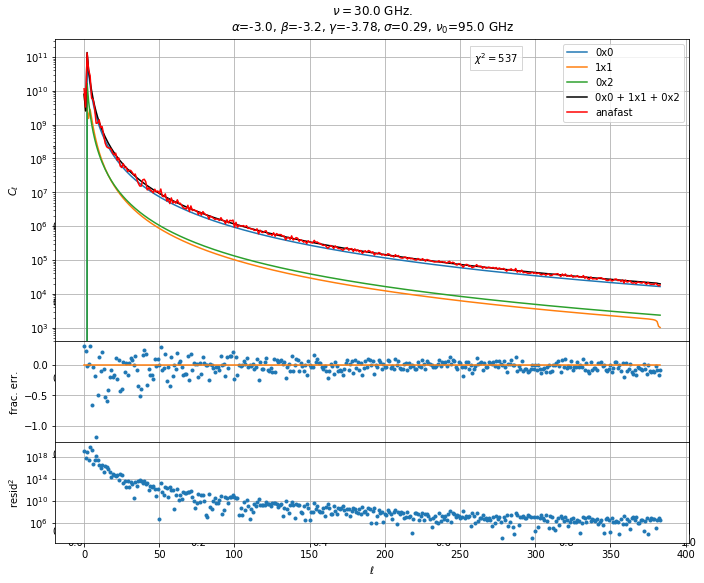

...

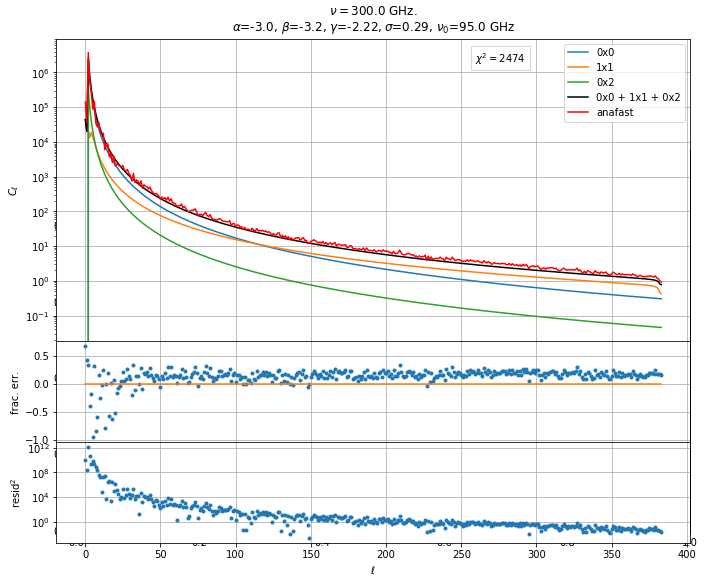

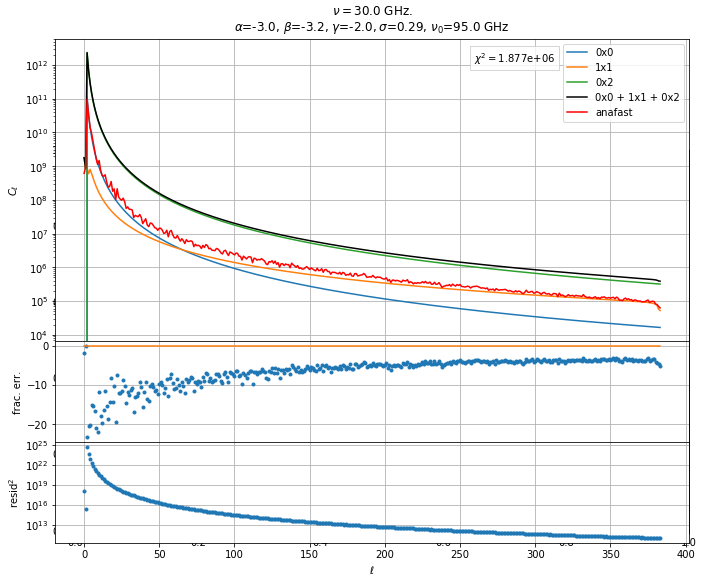

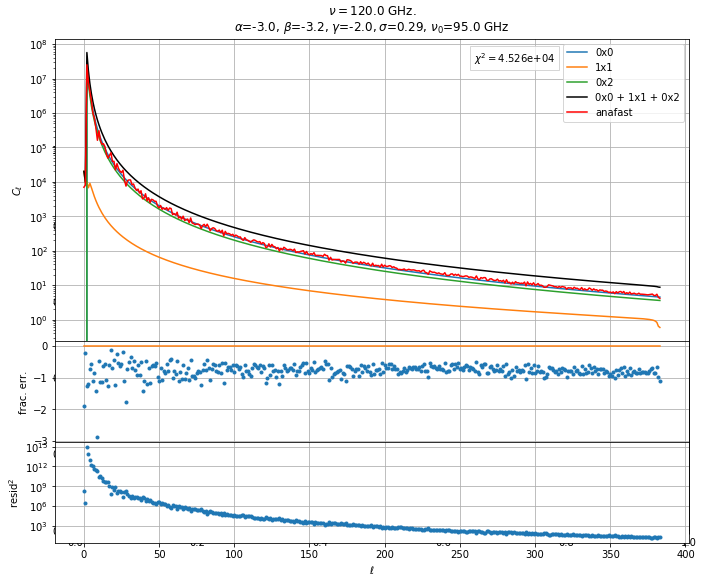

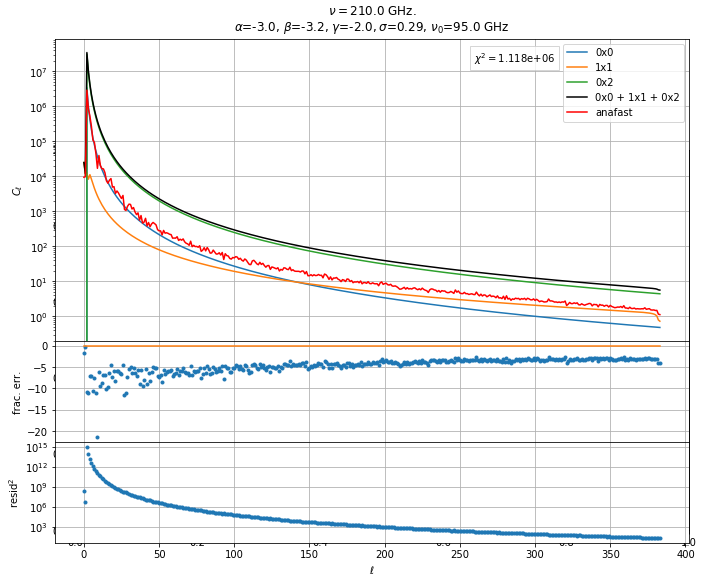

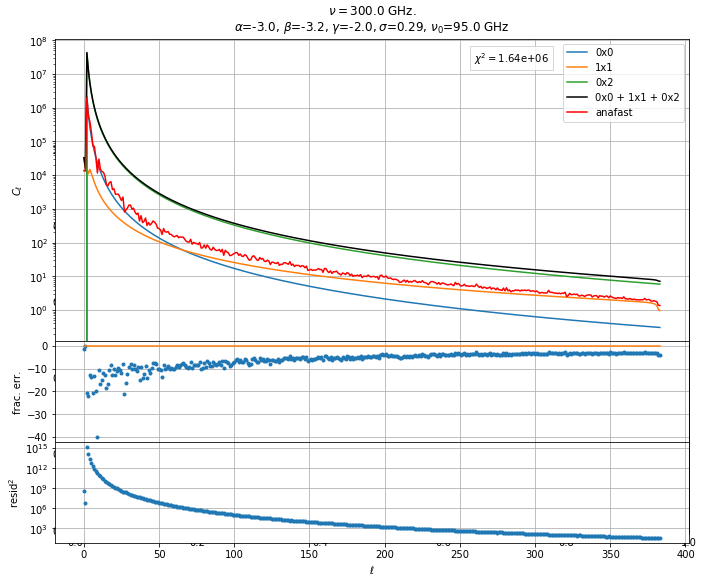

In [10]:
for gamma in gammas:
    ff.get_plots(freqs, gamma=gamma)

In [ ]:
#hmmmmm...

# $\chi^2$ for varying $\alpha$
These will be slow, the slowness in calculating $\chi^2$ comes from calculating the `1x1` moment, which comes from the `get_wigner_sum` function. There are places in `get_wigner_sum` that take up $\mathcal{O}(10\%)$ of the time that seem like they should be quick... 

$\chi^2$ stuff is behaving worryingly. The $\chi^2$ value appears highly dependent on the particular realisation, consider box and whisker plot below, where $\chi^2$ varies by 4-5 orders of magnitude in the outliers, and that even the median box varies by order 3-5. How do we get around this except by averaging everything, which we can't do on the real sky, and how can we hope to fit with this?

In [5]:
%autoreload

In [11]:
#default power spectrum we'll compare too
full_map = ff.map_full_power(30e9)
data = hp.anafast(full_map)
#default model
model_default = ff.auto0x0(30e9)+ff.auto1x1(30e9)+ff.auto0x2(30e9)

In [72]:
alphas_long = np.linspace(-6., -1., 20)
alphas_tight = np.linspace(-3.5, -2.5, 10)

In [73]:
start=time.time()
chi2_alpha_long = np.zeros(len(alphas_long))
for i in range(len(alphas_long)):
    chi_square = 0
    mom0x0 = ff.auto0x0(30e9, alpha=alphas_long[i])
    mom1x1 = ff.auto1x1(30e9, alpha=alphas_long[i])
    mom0x2 = ff.auto0x2(30e9, alpha=alphas_long[i])
    model = mom0x0 + mom0x2 + mom1x1 
    resid = data - model
    for ell in range(len(resid)):
        cosmic_var = 2/(2*ell+1) * data[ell]**2
        chi_square += resid[ell]**2 / cosmic_var
    chi2_alpha_long[i] += chi_square
#     print(chi_square)
    
print(chi2_alpha_long) 
print(time.time()-start)

[4.78975974e+15 4.86919460e+14 9.78501528e+13 1.58322700e+13
 2.25639893e+12 4.07248674e+11 5.57513371e+10 8.13260469e+09
 8.19703454e+08 1.91027230e+08 1.97138379e+07 3.88312234e+06
 7.06327159e+05 7.17287731e+04 1.34689246e+04 1.33181489e+04
 4.87957457e+04 1.70812798e+05 4.45255028e+05 1.16353661e+06]
93.28652691841125


Text(0.5, 1.0, '30 GHz, all other parameters at defualt')

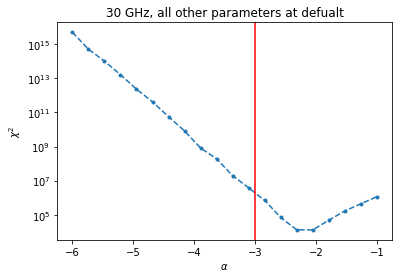

In [74]:
figure()
semilogy(alphas_long, chi2_alpha_long, '.--')
xlabel(r'$\alpha$')
ylabel(r'$\chi^2$')
axvline(-3.0, color='r')
title('30 GHz, all other parameters at defualt')

In [8]:
start=time.time()
chi2_alpha_tight = np.zeros(len(alphas_tight))

for i in range(len(alphas_tight)):
    chi_square = 0
    mom0x0 = ff.auto0x0(30e9, alpha=alphas_tight[i])
    mom1x1 = ff.auto1x1(30e9, alpha=alphas_tight[i])
    mom0x2 = ff.auto0x2(30e9, alpha=alphas_tight[i])
    model = mom0x0 + mom1x1 + mom0x2
    resid = data - model
    for ell in range(len(resid)):
        cosmic_var = 2/(2*ell+1) * data[ell]**2
        chi_square += resid[ell]**2 / cosmic_var
    chi2_alpha_tight[i] += chi_square
#     print(chi_square)
    
print(chi2_alpha_tight) 
print(time.time()-start)

[2.77518386e+08 1.01981761e+08 6.01696490e+07 2.30166539e+07
 9.07777408e+06 4.54322991e+06 1.51435800e+06 6.23805392e+05
 4.29027161e+05 1.66682084e+05]
60.23516082763672


In [152]:
# def my_func():
#     start=time.time()
#     chi2_alpha = np.zeros(len(alphas_long))
#     for i in range(len(alphas_long)):
#         chi_square = 0
#         full_map = ff.map_full_power(30e9, alpha=alphas_long[i])
#         data = hp.anafast(full_map)
#         mom0x0 = ff.auto0x0(30e9, alpha=alphas_long[i])
#         mom1x1 = ff.auto1x1(30e9, alpha=alphas_long[i])
#         mom0x2 = ff.auto0x2(30e9, alpha=alphas_long[i])
#         model = mom0x0 + mom1x1 + mom0x2
#         resid = data - model
#         for ell in range(len(resid)):
#             cosmic_var = 2/(2*ell+1) * data[ell]**2
#             chi_square += resid[ell]**2 / cosmic_var
#         chi2_alpha[i] += chi_square
#     #     print(chi_square)

#     print(chi2_alpha) 
#     print(time.time()-start)
#     return None

In [153]:
# %lprun -f ff.get_wigner_sum ff.get_wigner_sum(384, pcls, bcls)

In [143]:
pcls, ampmap = ff.map_amp()
bcls, betamap = ff.map_power_beta()

Text(0.5, 1.0, 'all other parameters at defualt')

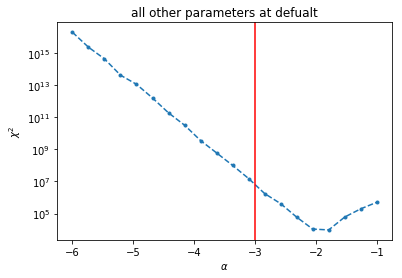

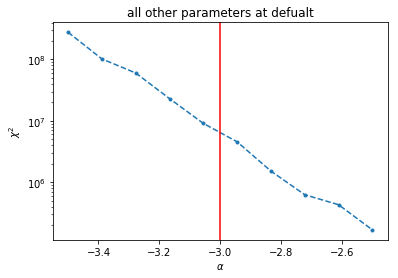

In [9]:
figure()
semilogy(alphas_long, chi2_alpha_long, '.--')
xlabel(r'$\alpha$')
ylabel(r'$\chi^2$')
axvline(-3.0, color='r')
title('all other parameters at defualt')

figure()
semilogy(alphas_tight, chi2_alpha_tight, '.--')
xlabel(r'$\alpha$')
ylabel(r'$\chi^2$')
axvline(-3.0, color='r')
title('all other parameters at defualt')

Text(0.5, 1.0, 'all other parameters at defualt')

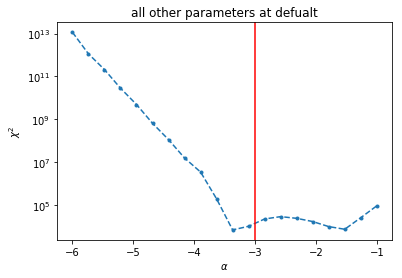

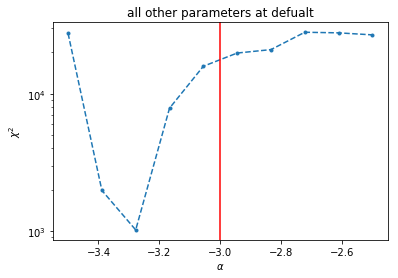

In [71]:
figure()
semilogy(alphas_long, chi2_alpha_long, '.--')
xlabel(r'$\alpha$')
ylabel(r'$\chi^2$')
axvline(-3.0, color='r')
title('all other parameters at defualt')

figure()
semilogy(alphas_tight, chi2_alpha_tight, '.--')
xlabel(r'$\alpha$')
ylabel(r'$\chi^2$')
axvline(-3.0, color='r')
title('all other parameters at defualt')

In [ ]:
#below with N=100 takes ~10 mins to run. I've saved the chi square values to a file
#chi_square_realisation.npy
#has 100 realisations of chi2 with all default parameters

In [ ]:
#check how much chi2 varies with realisations of the same parameters input:
#something is broken in this loop, it doesn't terminate ever...
# start = time.time()
# N=1
# chi2_realisation = np.zeros(N)
# for i in range(N):
#     chi_square = 0
#     resid = hp.anafast(ff.map_power_beta(30e9)) - model_default
#     for ell in range(len(resid)):
#         cosmic_var = 2/(2*ell+1) * data[ell]**2
#         chi_square += resid[ell]**2 / cosmic_var
#     chi2_realisation[i] += chi_square
# end=time.time()
# print(end-start)

In [58]:
print(np.median(chi2_realisation))
print(np.mean(chi2_realisation))

2482.681549126445
567046.6369780011


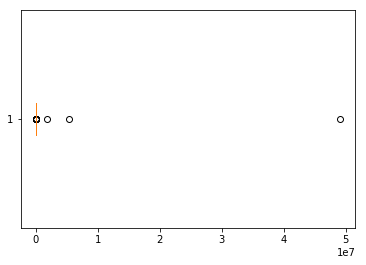

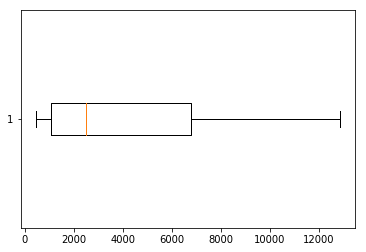

In [59]:
figure()
boxplot(chi2_realisation, vert=False);
figure()
boxplot(chi2_realisation, vert=False, sym='');

Text(0.5, 1.0, 'Default map at 30 GHz, 100 realisations.')

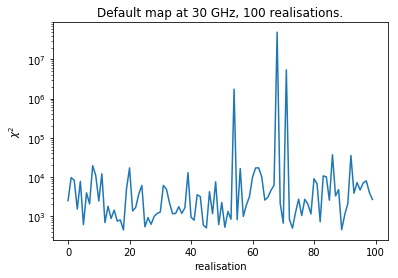

In [63]:
semilogy(chi2_realisation)
xlabel('realisation')
ylabel(r'$\chi^2$')
title('Default map at 30 GHz, 100 realisations.')

In [214]:
np.save('chi_square_realisation', chi2_realisation)

In [10]:
chi2_realisation_alpha = np.load('chi_square_realisation.npy')

Text(0.5, 1.0, '$\\chi^2$ vs realisation number...')

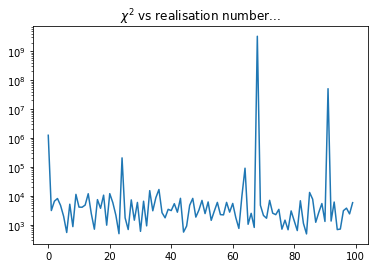

In [17]:
semilogy(chi2_realisation_alpha)
title(r'$\chi^2$ vs realisation number...')

# Vary $\beta$ and check $\chi^2$

In [75]:
betas_long = np.linspace(-6., -1., 10)
betas_tight = np.linspace(-3.7, -2.7, 10)

In [76]:
#chi2 over wide range of beta
start=time.time()
chi2_beta_long = np.zeros(len(betas_long))
full_map = ff.map_full_power(30e9)
for i in range(len(betas_long)):
    chi_square = 0
    mom0x0 = ff.auto0x0(30e9, beta=betas_long[i])
    mom1x1 = ff.auto1x1(30e9, beta=betas_long[i])
    mom0x2 = ff.auto0x2(30e9, beta=betas_long[i])
    model = mom0x0 + mom0x2 + mom1x1 
    resid = data - model
    for ell in range(len(resid)):
        cosmic_var = 2/(2*ell+1) * data[ell]**2
        chi_square += resid[ell]**2 / cosmic_var
    chi2_beta_long[i] += chi_square
#     print(chi_square)
    
print(chi2_beta_long) 
print(time.time()-start)

[6.28577606e+11 4.62920780e+10 4.66279069e+09 2.67538957e+08
 2.19358100e+07 2.14176888e+06 1.96514666e+05 7.21665257e+04
 7.05694169e+04 7.25774160e+04]
42.27881479263306


Text(0.5, 1.0, '30 GHz, all other parameters at defualt')

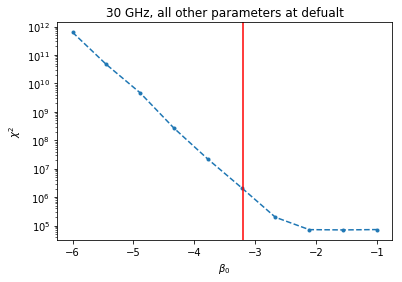

In [77]:
figure()
semilogy(betas_long, chi2_beta_long, '.--')
xlabel(r'$\beta_0$')
ylabel(r'$\chi^2$')
axvline(-3.2, color='r')
title('30 GHz, all other parameters at defualt')

Text(0.5, 1.0, 'all other parameters at defualt')

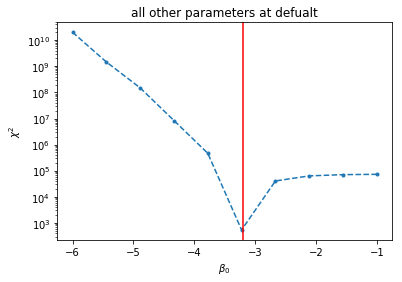

In [10]:
figure()
semilogy(betas_long, chi2_beta_long, '.--')
xlabel(r'$\beta_0$')
ylabel(r'$\chi^2$')
axvline(-3.2, color='r')
title('all other parameters at defualt')

In [14]:
#chi2 over tight range of beta
start=time.time()
chi2_beta_tight = np.zeros(len(betas_tight))

for i in range(len(betas_tight)):
    chi_square = 0
    mom0x0 = ff.auto0x0(30e9, beta=betas_tight[i])
    mom1x1 = ff.auto1x1(30e9, beta=betas_tight[i])
    mom0x2 = ff.auto0x2(30e9, beta=betas_tight[i])
    model = mom0x0 + mom0x2 + mom1x1 
    resid = data - model
    for ell in range(len(resid)):
        cosmic_var = 2/(2*ell+1) * data[ell]**2
        chi_square += resid[ell]**2 / cosmic_var
    chi2_beta_tight[i] += chi_square
#     print(chi_square)
    
print(chi2_beta_tight) 
print(time.time()-start)

[23076.25252002  6225.20116385   621.36565313  4618.79620691
 18264.50010779 22917.86124095 33948.19892347 39190.98544611
 46775.12621836 55261.29210928]
62.94226884841919


Text(0.5, 1.0, 'all other parameters at defualt')

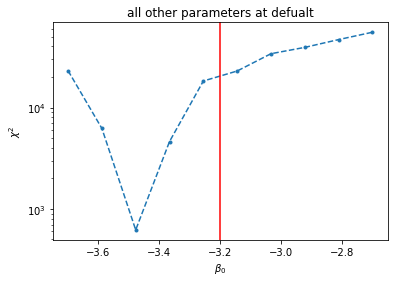

In [15]:
figure()
semilogy(betas_tight, chi2_beta_tight, '.--')
xlabel(r'$\beta_0$')
ylabel(r'$\chi^2$')
axvline(-3.2, color='r')
title('all other parameters at defualt')

# check that the model isn't changing and that only the fluctuations are changing

In [44]:
#particular realisation:
fixed_anafast = hp.anafast(ff.map_full_power(30e9))

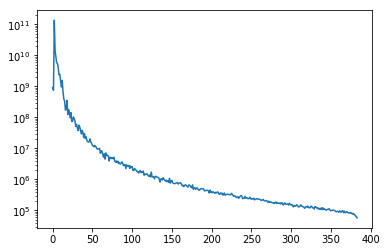

In [46]:

start=time.time()
model_test_chi2 = np.zeros(10)

for i in range(10):
    chi_square = 0
    data = fixed_anafast
    mom0x0 = ff.auto0x0(30e9)
    mom1x1 = ff.auto1x1(30e9)
    mom0x2 = ff.auto0x2(30e9)
    model = mom0x0 + mom0x2 + mom1x1 
    resid = data - model
    for ell in range(len(resid)):
        cosmic_var = 2/(2*ell+1) * data[ell]**2
        chi_square += resid[ell]**2 / cosmic_var
    model_test_chi2 += chi_square
#     print(chi_square)
    
print(model_test_chi2) 
print(time.time()-start)

[7108.89160073 7108.89160073 7108.89160073 7108.89160073 7108.89160073
 7108.89160073 7108.89160073 7108.89160073 7108.89160073 7108.89160073]
64.82773804664612


In [47]:
model_test_chi2 -= np.mean(model_test_chi2)
print(model_test_chi2)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [16]:
#okay, so model isn't changing. That's good at least.

# Vary $\gamma$

In [53]:
#set of gamma values
gammas_long = np.linspace(-4., -2.001, 20)
gammas_tight = np.linspace(-2.15,-2.0001, 15)

In [33]:
#chi2 over wide range of gamma
start=time.time()
chi2_gamma_long = np.zeros(len(gammas_long))
full_map = ff.map_full_power(30e9)
for i in range(len(gammas_long)):
    chi_square = 0
    mom0x0 = ff.auto0x0(30e9)
    mom1x1 = ff.auto1x1(30e9, gamma=gammas_long[i])
    mom0x2 = ff.auto0x2(30e9, gamma=gammas_long[i])
    model = mom0x0 + mom0x2 + mom1x1 
    resid = data - model
    for ell in range(len(resid)):
        cosmic_var = 2/(2*ell+1) * data[ell]**2
        chi_square += resid[ell]**2 / cosmic_var
    chi2_gamma_long[i] += chi_square
#     print(chi_square)
    
print(chi2_gamma_long) 
print(time.time()-start)

[ 52792.3260275   53789.43035133  53397.36021399  52950.30316252
  52421.38009402  53242.49599104  51979.89819661  52485.68235431
  52783.05287847  51032.35153443  50943.38793516  47392.38022405
  48801.49500529  47474.61428187  40376.1825426   40117.58447745
  32097.08458762  30419.34987084  22471.9780636  349816.13771598]
125.10576701164246


In [41]:
#chi2 over tight range of beta
start=time.time()
chi2_gamma_tight = np.zeros(len(gammas_tight))

for i in range(len(gammas_tight)):
    chi_square = 0
    mom0x0 = ff.auto0x0(30e9)
    mom1x1 = ff.auto1x1(30e9, gamma=gammas_tight[i])
    mom0x2 = ff.auto0x2(30e9, gamma=gammas_tight[i])
    model = mom0x0 + mom0x2 + mom1x1 
    resid = data - model
    for ell in range(len(resid)):
        cosmic_var = 2/(2*ell+1) * data[ell]**2
        chi_square += resid[ell]**2 / cosmic_var
    chi2_gamma_tight[i] += chi_square
#     print(chi_square)
    
print(chi2_gamma_tight) 
print(time.time()-start)

[2.26505999e+04 2.08510691e+04 2.02517716e+04 1.80658776e+04
 1.89570665e+04 1.87937121e+04 1.87131193e+04 1.71730869e+04
 2.01433454e+04 1.25407315e+04 1.62253265e+04 1.39740840e+04
 8.42978462e+03 7.38611016e+03 4.69996479e+07]
94.64711904525757


Text(0.5, 1.0, 'all other parameters at defualt')

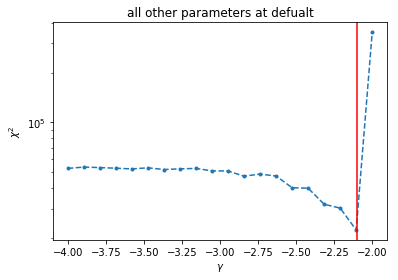

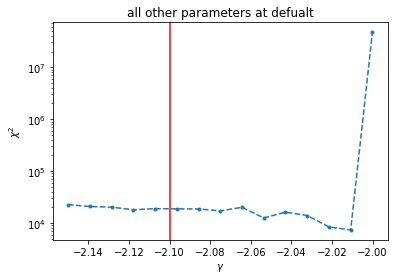

In [42]:
figure()
semilogy(gammas_long, chi2_gamma_long, '.--')
xlabel(r'$\gamma$')
ylabel(r'$\chi^2$')
axvline(-2.1, color='r')
title('all other parameters at defualt')

figure()
semilogy(gammas_tight, chi2_gamma_tight, '.--')
xlabel(r'$\gamma$')
ylabel(r'$\chi^2$')
axvline(-2.1, color='r')
title('all other parameters at defualt')

# Make say 4 plots of the $\chi^2$ varying over a set of parameters
note that runtime for producing each of these sets of 4 plots is something like ~7 minutes

In [65]:
%autoreload

(0,0)
(0,3)
(0,6)
(0,9)
(0,12)
(0,15)
(0,18)
(1,0)
(1,3)
(1,6)
(1,9)
(1,12)
(1,15)
(1,18)
(2,0)
(2,3)
(2,6)
(2,9)
(2,12)
(2,15)
(2,18)
(3,0)
(3,3)
(3,6)
(3,9)
(3,12)
(3,15)
(3,18)
383.323637008667


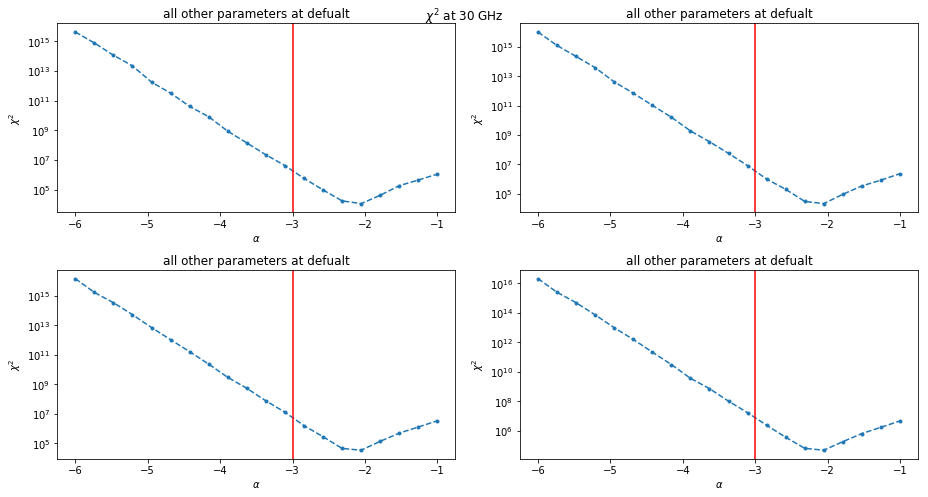

In [66]:
start=time.time()
chi2_alpha_long = np.zeros(len(alphas_long))
figure(figsize=(13,7))
for N in range(4):
    for i in range(len(alphas_long)):
        if i%3==0:
            print('({:d},{:d})'.format(N, i))
        chi_square = 0
        mom0x0 = ff.auto0x0(30e9, alpha=alphas_long[i])
        mom1x1 = ff.auto1x1(30e9, alpha=alphas_long[i])
        mom0x2 = ff.auto0x2(30e9, alpha=alphas_long[i])
        model = mom0x0 + mom0x2 + mom1x1 
        resid = data - model
        for ell in range(len(resid)):
            cosmic_var = 2/(2*ell+1) * data[ell]**2
            chi_square += resid[ell]**2 / cosmic_var
        chi2_alpha_long[i] += chi_square

    
    subplot(2,2,N+1)
    semilogy(alphas_long, chi2_alpha_long, '.--')
    xlabel(r'$\alpha$')
    ylabel(r'$\chi^2$')
    axvline(-3.0, color='r')
    title('all other parameters at defualt')
    tight_layout()
    suptitle(r'$\chi^2$ at 30 GHz')
print(time.time()-start)

(0,0)
(0,3)
(0,6)
(0,9)
(0,12)
(0,15)
(0,18)
(1,0)
(1,3)
(1,6)
(1,9)
(1,12)
(1,15)
(1,18)
(2,0)
(2,3)
(2,6)
(2,9)
(2,12)
(2,15)
(2,18)
(3,0)
(3,3)
(3,6)
(3,9)
(3,12)
(3,15)
(3,18)
451.8309361934662


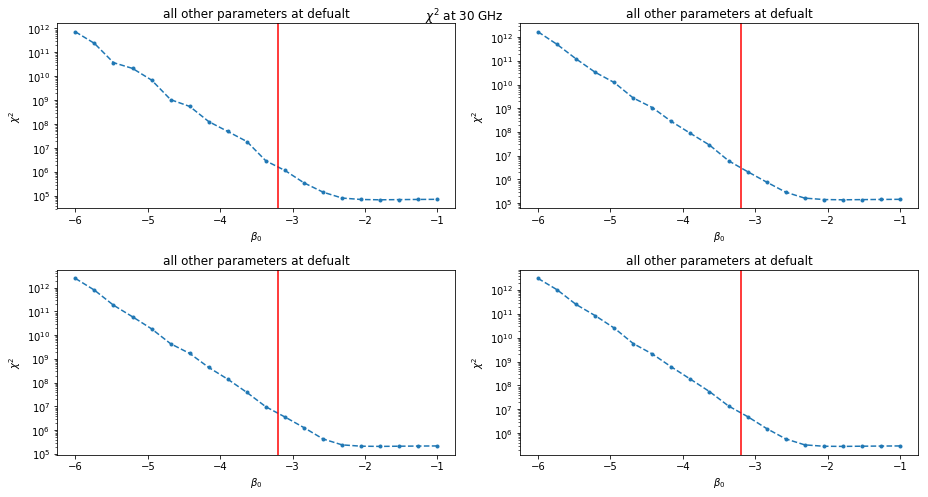

In [67]:
start=time.time()
chi2_beta_long = np.zeros(len(betas_long))
figure(figsize=(13,7))
for N in range(4):
    for i in range(len(betas_long)):
        if i%3==0:
            print('({:d},{:d})'.format(N, i))
        chi_square = 0
        mom0x0 = ff.auto0x0(30e9, beta=betas_long[i])
        mom1x1 = ff.auto1x1(30e9, beta=betas_long[i])
        mom0x2 = ff.auto0x2(30e9, beta=betas_long[i])
        model = mom0x0 + mom0x2 + mom1x1 
        resid = data - model
        for ell in range(len(resid)):
            cosmic_var = 2/(2*ell+1) * data[ell]**2
            chi_square += resid[ell]**2 / cosmic_var
        chi2_beta_long[i] += chi_square

    
    subplot(2,2,N+1)
    semilogy(betas_long, chi2_beta_long, '.--')
    xlabel(r'$\beta_0$')
    ylabel(r'$\chi^2$')
    axvline(-3.2, color='r')
    title('all other parameters at defualt')
    tight_layout()
    suptitle(r'$\chi^2$ at 30 GHz')
print(time.time()-start)

(0,0)
(0,3)
(0,6)
(0,9)
(0,12)
(0,15)
(0,18)
(1,0)
(1,3)
(1,6)
(1,9)
(1,12)
(1,15)
(1,18)
(2,0)
(2,3)
(2,6)
(2,9)
(2,12)
(2,15)
(2,18)
(3,0)
(3,3)
(3,6)
(3,9)
(3,12)
(3,15)
(3,18)
351.27327489852905


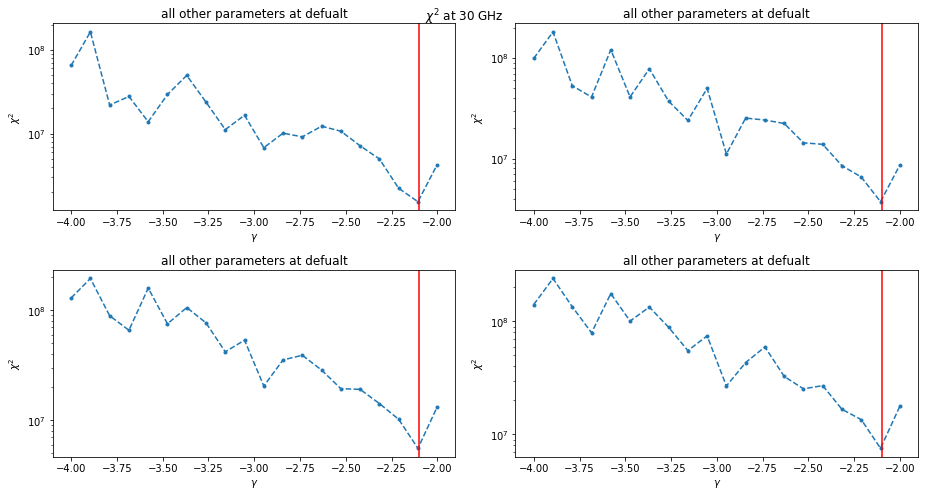

In [68]:
start=time.time()
chi2_gamma_long = np.zeros(len(gammas_long))
figure(figsize=(13,7))
for N in range(4):
    for i in range(len(gammas_long)):
        if i%3==0:
            print('({:d},{:d})'.format(N, i))
        chi_square = 0
        mom0x0 = ff.auto0x0(30e9)
        mom1x1 = ff.auto1x1(30e9, gamma=gammas_long[i])
        mom0x2 = ff.auto0x2(30e9, gamma=gammas_long[i])
        model = mom0x0 + mom0x2 + mom1x1 
        resid = data - model
        for ell in range(len(resid)):
            cosmic_var = 2/(2*ell+1) * data[ell]**2
            chi_square += resid[ell]**2 / cosmic_var
        chi2_gamma_long[i] += chi_square

    
    subplot(2,2,N+1)
    semilogy(gammas_long, chi2_gamma_long, '.--')
    xlabel(r'$\gamma$')
    ylabel(r'$\chi^2$')
    axvline(-2.1, color='r')
    title('all other parameters at defualt')
    tight_layout()
    suptitle(r'$\chi^2$ at 30 GHz')
print(time.time()-start)

In [44]:
#investigate gamma further
#make a map with a gamma further from -2 to see how it goes
full_map_3 = ff.map_full_power(30e9, gamma=-3.0)
data_3 = hp.anafast(full_map_3)
#default model
model_default_3 = ff.auto0x0(30e9)+ff.auto1x1(30e9, gamma=-3.0)+ff.auto0x2(30e9, gamma=-3.0)

In [59]:
gammas_3 = np.linspace(-4,-2.5,15)
# len(gammas_3)

(0,0)
(0,3)
(0,6)
(0,9)
(0,12)
[ 48.90203465  52.67074925  66.77903186  82.44738177  82.16318698
  55.23659916  38.15656352  32.5484465   53.4189729   24.27651539
  25.05120503  31.31158788  66.6101873  158.37350948 548.71609185]
(1,0)
(1,3)
(1,6)
(1,9)
(1,12)
[ 134.6066383   103.62891718  118.20493016  169.63055964  175.11161603
  115.20215737   88.90121644   99.62470057  107.81223917   99.04440269
   52.27721852   62.31166879  133.75920911  384.97166954 1204.44997804]
(2,0)
(2,3)
(2,6)
(2,9)
(2,12)
[ 188.88626166  132.0431932   179.21807042  274.87472275  238.52777527
  197.90282257  124.38931076  151.63378949  181.18476858  140.95028949
  128.47872747   94.07699187  238.07596849  697.30129188 1423.70167956]
(3,0)
(3,3)
(3,6)
(3,9)
(3,12)
[ 287.85799443  268.17007729  275.17939243  331.49075279  366.15835216
  292.31605212  162.33467719  245.70656126  245.47522843  181.67212304
  173.59818952  125.61239075  340.95002841  789.42050076 1544.07319657]
343.18813586235046


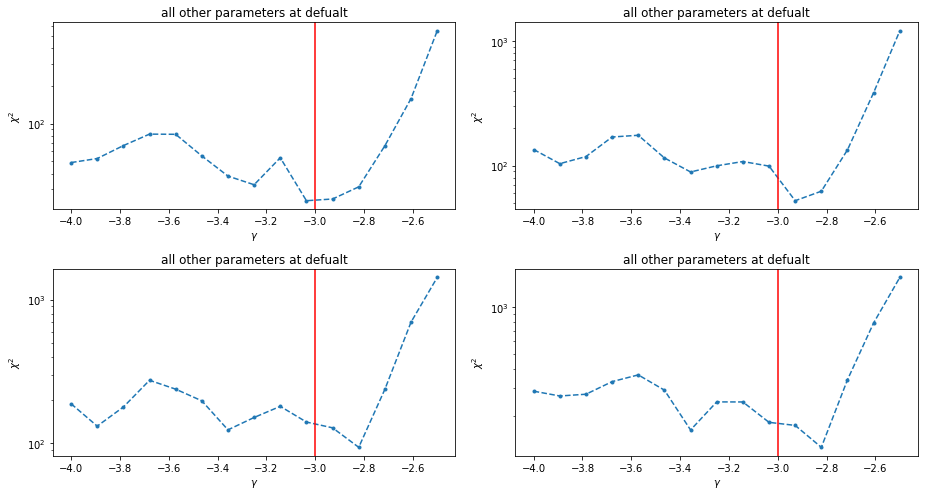

In [60]:
start=time.time()
chi2_gamma_3 = np.zeros(len(gammas_3))
figure(figsize=(13,7))
for N in range(4):
    for i in range(len(gammas_3)):
        if i%3==0:
            print('({:d},{:d})'.format(N, i))
        chi_square = 0
        mom0x0 = ff.auto0x0(30e9)
        mom1x1 = ff.auto1x1(30e9, gamma=gammas_3[i])
        mom0x2 = ff.auto0x2(30e9, gamma=gammas_3[i])
        model = mom0x0 + mom0x2 + mom1x1 
        resid = data_3 - model
        for ell in range(len(resid)):
            cosmic_var = 2/(2*ell+1) * data[ell]**2
            chi_square += resid[ell]**2 / cosmic_var
        chi2_gamma_3[i] += chi_square

#     print(chi2_gamma_3)
    subplot(2,2,N+1)
    semilogy(gammas_3, chi2_gamma_3, '.--')
    xlabel(r'$\gamma$')
    ylabel(r'$\chi^2$')
    axvline(-3.0, color='r')
    title('all other parameters at defualt')
    tight_layout()
    suptitle(r'$\chi^2$ at 30 GHz')
print(time.time()-start)

# check the effect of multiple realisation of maps on the $\chi^2$ value

In [37]:
#check against the 'default map'
# #default power spectrum we'll compare too
# full_map = ff.map_full_power(30e9)
# data = hp.anafast(full_map)
# #default model
# model_default = ff.auto0x0(30e9)+ff.auto1x1(30e9)+ff.auto0x2(30e9)
N = 200

In [38]:
start=time.time()
chi2_matrix = np.zeros(N, dtype=float)
for i in range(N):
    chi2 = 0
    map_N = ff.map_full_power(30e9)
    anafast_N = hp.anafast(map_N)
    residuals = anafast_N - model_default
    for ell in range(len(residuals)):
        cosmic_var = 2/(2*ell+1) * anafast_N[ell]**2
        chi2 += residuals[ell]**2/cosmic_var
    chi2_matrix[i] += chi2
    
print(time.time()-start)

51.67804288864136


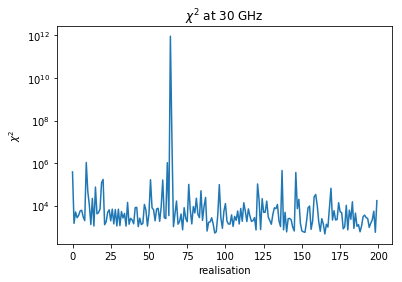

In [46]:
semilogy(chi2_matrix);
xlabel('realisation')
ylabel(r'$\chi^2$')
title(r'$\chi^2$ at 30 GHz');

In [40]:
#what about at another frequency?
model_default_120 = ff.auto0x0(120e9) + ff.auto1x1(120e9) + ff.auto0x2(120e9)

In [42]:
start=time.time()
chi2_matrix_120 = np.zeros(N, dtype=float)
for i in range(N):
    chi2 = 0
    map_N = ff.map_full_power(120e9)
    anafast_N = hp.anafast(map_N)
    residuals = anafast_N - model_default_120
    for ell in range(len(residuals)):
        cosmic_var = 2/(2*ell+1) * anafast_N[ell]**2
        chi2 += residuals[ell]**2/cosmic_var
    chi2_matrix_120[i] += chi2
    
print(time.time()-start)

47.23299503326416


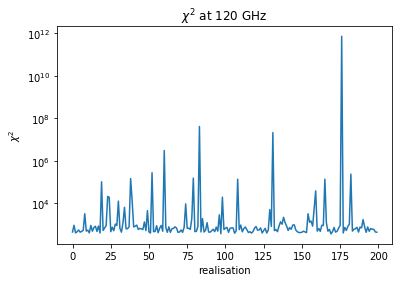

In [47]:
semilogy(chi2_matrix_120);
xlabel('realisation')
ylabel(r'$\chi^2$')
title(r'$\chi^2$ at 120 GHz');

# make the four plot comparison of the $\chi^2$ at a different frequency: 120 GHz and 300 GHz

In [49]:
data_120 = hp.anafast(ff.map_full_power(120e9))

model_default_300 = ff.auto0x0(300e9) + ff.auto1x1(300e9) + ff.auto0x2(300e9)
data_300 = hp.anafast(ff.map_full_power(300e9))

(0,0)
(0,3)
(0,6)
(0,9)
(0,12)
(0,15)
(0,18)
(1,0)
(1,3)
(1,6)
(1,9)
(1,12)
(1,15)
(1,18)
(2,0)
(2,3)
(2,6)
(2,9)
(2,12)
(2,15)
(2,18)
(3,0)
(3,3)
(3,6)
(3,9)
(3,12)
(3,15)
(3,18)
538.277594089508


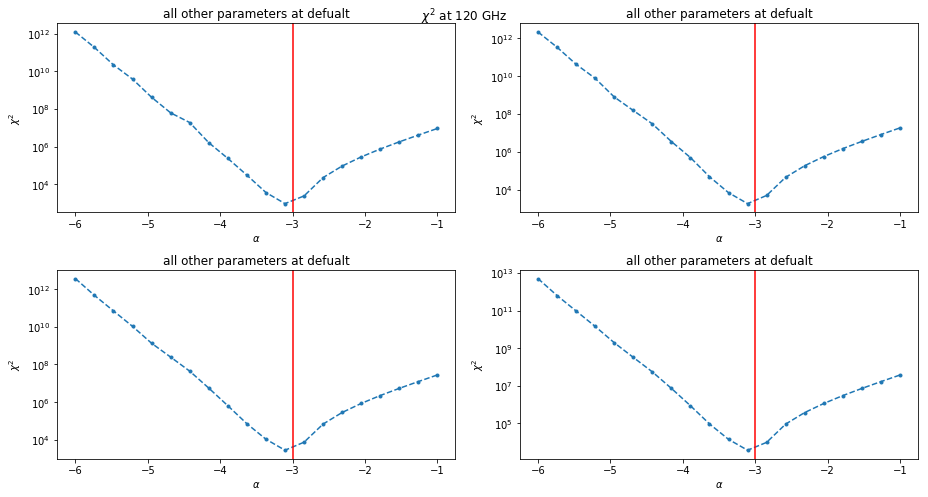

In [55]:
start=time.time()
chi2_alpha_long = np.zeros(len(alphas_long))
figure(figsize=(13,7))
for N in range(4):
    for i in range(len(alphas_long)):
        if i%3==0:
            print('({:d},{:d})'.format(N, i))
        chi_square = 0
        mom0x0 = ff.auto0x0(120e9, alpha=alphas_long[i])
        mom1x1 = ff.auto1x1(120e9, alpha=alphas_long[i])
        mom0x2 = ff.auto0x2(120e9, alpha=alphas_long[i])
        model = mom0x0 + mom0x2 + mom1x1 
        resid = data_120 - model
        for ell in range(len(resid)):
            cosmic_var = 2/(2*ell+1) * data_120[ell]**2
            chi_square += resid[ell]**2 / cosmic_var
        chi2_alpha_long[i] += chi_square

    
    subplot(2,2,N+1)
    semilogy(alphas_long, chi2_alpha_long, '.--')
    xlabel(r'$\alpha$')
    ylabel(r'$\chi^2$')
    axvline(-3.0, color='r')
    title('all other parameters at defualt')
    tight_layout()
    suptitle(r'$\chi^2$ at 120 GHz')
print(time.time()-start)

(0,0)
(0,3)
(0,6)
(0,9)
(0,12)
(0,15)
(0,18)
(1,0)
(1,3)
(1,6)
(1,9)
(1,12)
(1,15)
(1,18)
(2,0)
(2,3)
(2,6)
(2,9)
(2,12)
(2,15)
(2,18)
(3,0)
(3,3)
(3,6)
(3,9)
(3,12)
(3,15)
(3,18)
457.98133611679077


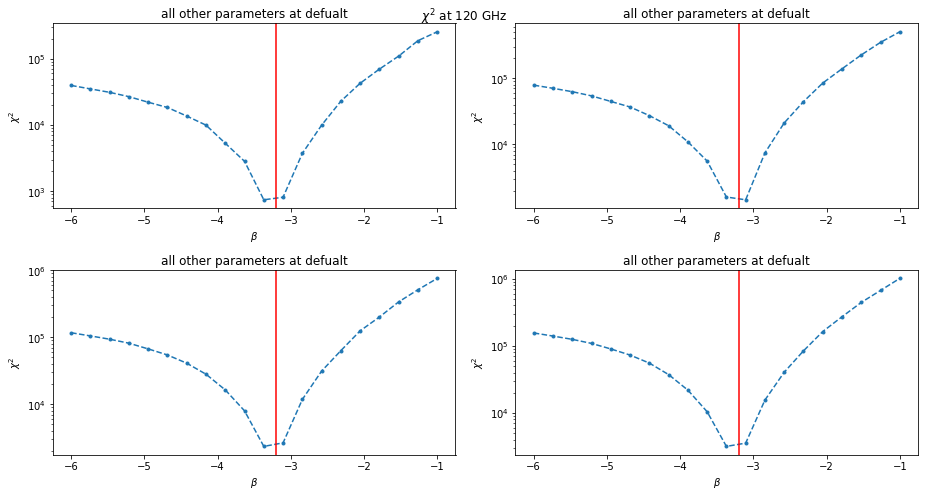

In [61]:
start=time.time()
chi2_beta_long = np.zeros(len(betas_long))
figure(figsize=(13,7))
for N in range(4):
    for i in range(len(betas_long)):
        if i%3==0:
            print('({:d},{:d})'.format(N, i))
        chi_square = 0
        mom0x0 = ff.auto0x0(120e9, beta=betas_long[i])
        mom1x1 = ff.auto1x1(120e9, beta=betas_long[i])
        mom0x2 = ff.auto0x2(120e9, beta=betas_long[i])
        model = mom0x0 + mom0x2 + mom1x1 
        resid = data_120 - model
        for ell in range(len(resid)):
            cosmic_var = 2/(2*ell+1) * data_120[ell]**2
            chi_square += resid[ell]**2 / cosmic_var
        chi2_beta_long[i] += chi_square

    
    subplot(2,2,N+1)
    semilogy(betas_long, chi2_beta_long, '.--')
    xlabel(r'$\beta$')
    ylabel(r'$\chi^2$')
    axvline(-3.2, color='r')
    title('all other parameters at defualt')
    tight_layout()
    suptitle(r'$\chi^2$ at 120 GHz')
print(time.time()-start)

(0,0)
(0,3)
(0,6)
(0,9)
(0,12)
(0,15)
(0,18)
(1,0)
(1,3)
(1,6)
(1,9)
(1,12)
(1,15)
(1,18)
(2,0)
(2,3)
(2,6)
(2,9)
(2,12)
(2,15)
(2,18)
(3,0)
(3,3)
(3,6)
(3,9)
(3,12)
(3,15)
(3,18)
986.8696129322052


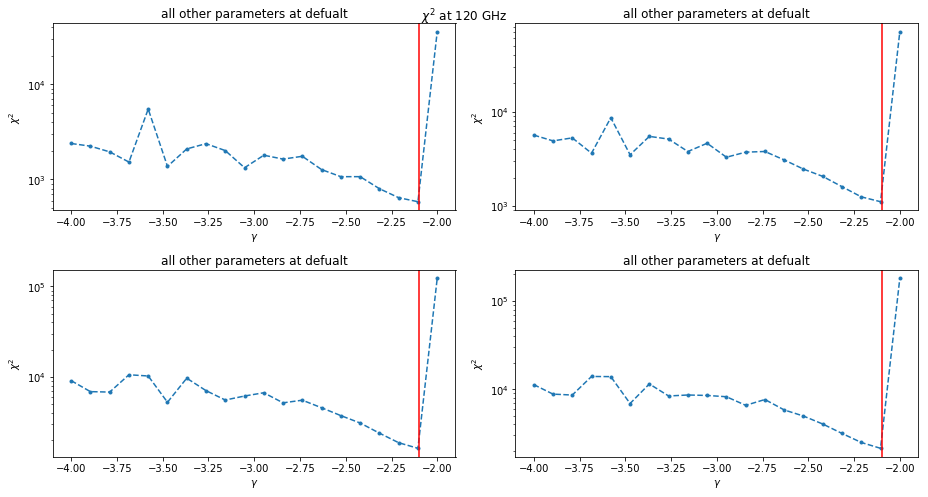

In [62]:
chi2_gamma_long = np.zeros(len(gammas_long))
figure(figsize=(13,7))
for N in range(4):
    for i in range(len(gammas_long)):
        if i%3==0:
            print('({:d},{:d})'.format(N, i))
        chi_square = 0
        mom0x0 = ff.auto0x0(120e9)
        mom1x1 = ff.auto1x1(120e9, gamma=gammas_long[i])
        mom0x2 = ff.auto0x2(120e9, gamma=gammas_long[i])
        model = mom0x0 + mom0x2 + mom1x1 
        resid = data_120 - model
        for ell in range(len(resid)):
            cosmic_var = 2/(2*ell+1) * data_120[ell]**2
            chi_square += resid[ell]**2 / cosmic_var
        chi2_gamma_long[i] += chi_square

    
    subplot(2,2,N+1)
    semilogy(gammas_long, chi2_gamma_long, '.--')
    xlabel(r'$\gamma$')
    ylabel(r'$\chi^2$')
    axvline(-2.1, color='r')
    title('all other parameters at defualt')
    tight_layout()
    suptitle(r'$\chi^2$ at 120 GHz')
print(time.time()-start)

(0,0)
(0,3)
(0,6)
(0,9)
(0,12)
(0,15)
(0,18)
(1,0)
(1,3)
(1,6)
(1,9)
(1,12)
(1,15)
(1,18)
(2,0)
(2,3)
(2,6)
(2,9)
(2,12)
(2,15)
(2,18)
(3,0)
(3,3)
(3,6)
(3,9)
(3,12)
(3,15)
(3,18)
488.7151219844818


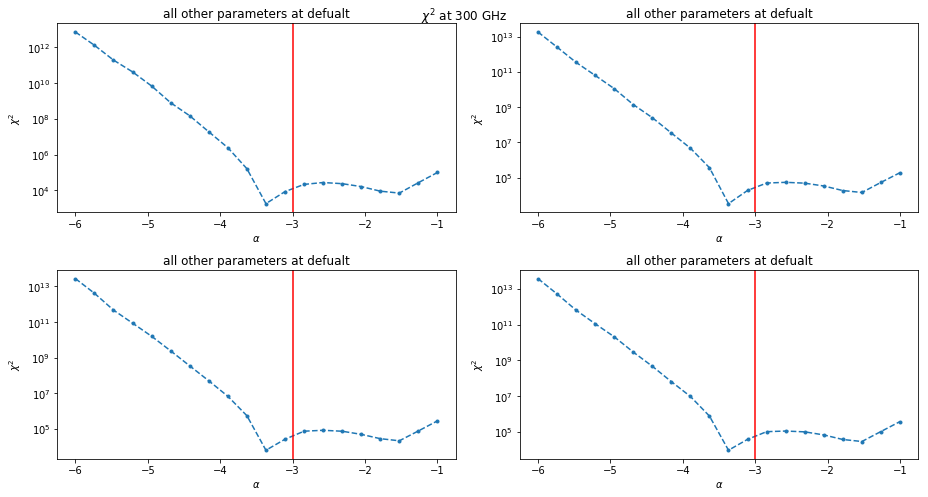

In [58]:
start=time.time()
chi2_alpha_long = np.zeros(len(alphas_long))
figure(figsize=(13,7))
for N in range(4):
    for i in range(len(alphas_long)):
        if i%3==0:
            print('({:d},{:d})'.format(N, i))
        chi_square = 0
        mom0x0 = ff.auto0x0(300e9, alpha=alphas_long[i])
        mom1x1 = ff.auto1x1(300e9, alpha=alphas_long[i])
        mom0x2 = ff.auto0x2(300e9, alpha=alphas_long[i])
        model = mom0x0 + mom0x2 + mom1x1 
        resid = data_300 - model
        for ell in range(len(resid)):
            cosmic_var = 2/(2*ell+1) * data_300[ell]**2
            chi_square += resid[ell]**2 / cosmic_var
        chi2_alpha_long[i] += chi_square

    
    subplot(2,2,N+1)
    semilogy(alphas_long, chi2_alpha_long, '.--')
    xlabel(r'$\alpha$')
    ylabel(r'$\chi^2$')
    axvline(-3.0, color='r')
    title('all other parameters at defualt')
    tight_layout()
    suptitle(r'$\chi^2$ at 300 GHz')
print(time.time()-start)

(0,0)
(0,3)
(0,6)
(0,9)
(0,12)
(0,15)
(0,18)
(1,0)
(1,3)
(1,6)
(1,9)
(1,12)
(1,15)
(1,18)
(2,0)
(2,3)
(2,6)
(2,9)
(2,12)
(2,15)
(2,18)
(3,0)
(3,3)
(3,6)
(3,9)
(3,12)
(3,15)
(3,18)
515.1167311668396


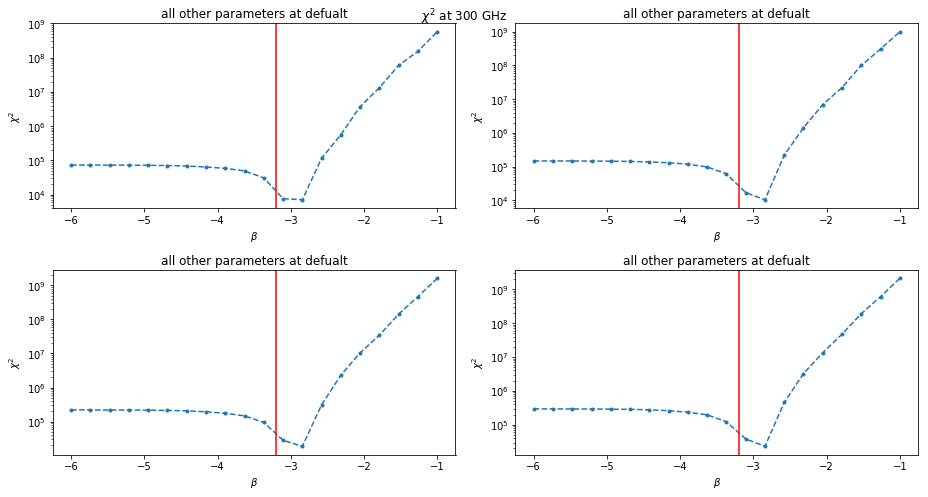

In [63]:
start=time.time()
chi2_beta_long = np.zeros(len(betas_long))
figure(figsize=(13,7))
for N in range(4):
    for i in range(len(betas_long)):
        if i%3==0:
            print('({:d},{:d})'.format(N, i))
        chi_square = 0
        mom0x0 = ff.auto0x0(300e9, beta=betas_long[i])
        mom1x1 = ff.auto1x1(300e9, beta=betas_long[i])
        mom0x2 = ff.auto0x2(300e9, beta=betas_long[i])
        model = mom0x0 + mom0x2 + mom1x1 
        resid = data_300 - model
        for ell in range(len(resid)):
            cosmic_var = 2/(2*ell+1) * data_300[ell]**2
            chi_square += resid[ell]**2 / cosmic_var
        chi2_beta_long[i] += chi_square

    
    subplot(2,2,N+1)
    semilogy(betas_long, chi2_beta_long, '.--')
    xlabel(r'$\beta$')
    ylabel(r'$\chi^2$')
    axvline(-3.2, color='r')
    title('all other parameters at defualt')
    tight_layout()
    suptitle(r'$\chi^2$ at 300 GHz')
print(time.time()-start)

(0,0)
(0,3)
(0,6)
(0,9)
(0,12)
(0,15)
(0,18)
(1,0)
(1,3)
(1,6)
(1,9)
(1,12)
(1,15)
(1,18)
(2,0)
(2,3)
(2,6)
(2,9)
(2,12)
(2,15)
(2,18)
(3,0)
(3,3)
(3,6)
(3,9)
(3,12)
(3,15)
(3,18)
1029.035504102707


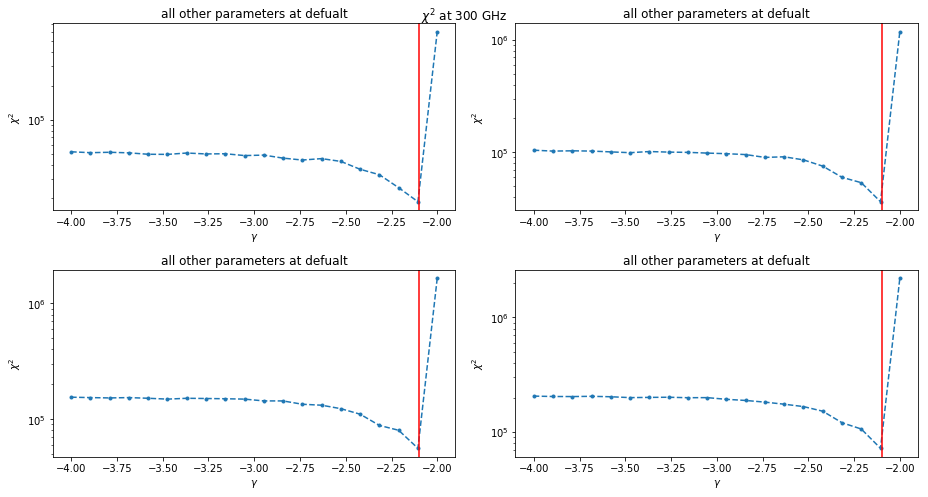

In [64]:
chi2_gamma_long = np.zeros(len(gammas_long))
figure(figsize=(13,7))
for N in range(4):
    for i in range(len(gammas_long)):
        if i%3==0:
            print('({:d},{:d})'.format(N, i))
        chi_square = 0
        mom0x0 = ff.auto0x0(300e9)
        mom1x1 = ff.auto1x1(300e9, gamma=gammas_long[i])
        mom0x2 = ff.auto0x2(300e9, gamma=gammas_long[i])
        model = mom0x0 + mom0x2 + mom1x1 
        resid = data_300 - model
        for ell in range(len(resid)):
            cosmic_var = 2/(2*ell+1) * data_300[ell]**2
            chi_square += resid[ell]**2 / cosmic_var
        chi2_gamma_long[i] += chi_square

    
    subplot(2,2,N+1)
    semilogy(gammas_long, chi2_gamma_long, '.--')
    xlabel(r'$\gamma$')
    ylabel(r'$\chi^2$')
    axvline(-2.1, color='r')
    title('all other parameters at defualt')
    tight_layout()
    suptitle(r'$\chi^2$ at 300 GHz')
print(time.time()-start)

In [82]:
#check that the 1x1 function is working properly after all the fiddling for optimisation
nu0 = 2.3e9
ells = np.arange(384)

In [89]:
test_map = ff.map_full_power(freqs)
test_mom00 = ff.auto0x0(freqs)
test_mom11 = ff.auto1x1(freqs)
test_mom02 = ff.auto0x2(freqs)
test_model =  test_mom00 + test_mom11 + test_mom02 

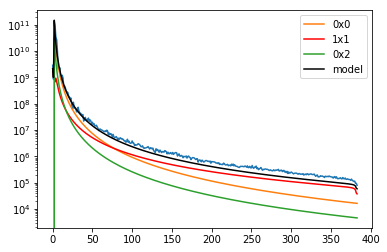

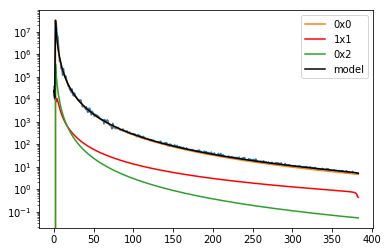

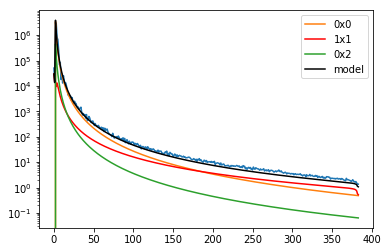

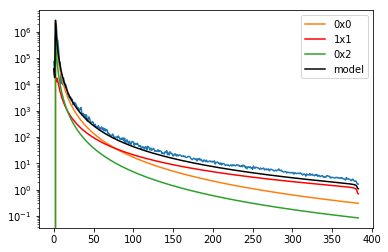

In [90]:
for i in range(len(freqs)):
    figure()
    check_cls = hp.anafast(test_map[i])
    semilogy(ells, check_cls)
    semilogy(ells, test_mom00[i], label='0x0')
    semilogy(ells, test_mom11[i], 'r',label='1x1')
    semilogy(ells, test_mom02[i], label='0x2')
    semilogy(ells, test_model[i], 'k',label='model')
    legend()